In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as ad
import scanpy.external as sce
import decoupler as dc
# import scrublet as scr
# import muon as mu
#from vpolo.alevin import parser # to parse alevin output
import matplotlib.pyplot as plt
import seaborn as sns

import statsmodels.api as sm
import statsmodels.stats.multitest as multi
from adjustText import adjust_text
import re

seed = 0
np.random.seed(seed)
%matplotlib inline

import matplotlib as mpl
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

In [2]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis', transparent=False, frameon=False)  # low dpi (dots per inch) yields small inline figures

import matplotlib as mpl
# 2 lines below solved the facecolor problem.
# mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
sc.settings.autosave = True
sc.logging.print_header()

version = '250407_CSF_downstream'
# input_table = '../data/231009_PBMC_HH514.csv'

results_file = '../scanpy/{}/res.h5ad'.format(version)
results_file_mu = '../scanpy/{}/res.h5mu'.format(version)
results_file_cellxgene = '../scanpy/{}/res.cxg.h5ad'.format(version)

import os
os.makedirs('../scanpy/{}'.format(version), exist_ok=True)

sc.settings.figdir = '../scanpy/{}/graph'.format(version)
sc.settings.cachedir = '../scanpy/{}/cache'.format(version)
# %config InlineBackend.figure_format = 'retina'

import os
os.makedirs('../scanpy/{}'.format(version), exist_ok=True)
os.makedirs(sc.settings.figdir, exist_ok=True)

2025-05-02 15:46:08.962342: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-05-02 15:46:08.979503: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-05-02 15:46:08.995977: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-05-02 15:46:09.000458: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-05-02 15:46:09.014476: I tensorflow/core/platform/cpu_feature_guar

scanpy==1.10.2 anndata==0.10.9 umap==0.5.6 numpy==1.26.4 scipy==1.13.0 pandas==2.2.3 scikit-learn==1.5.1 statsmodels==0.14.2 igraph==0.11.6 pynndescent==0.5.13


In [3]:
adata = sc.read('/home/yy693/pi_hafler/ASAP/scanpy/241027_CSF_integrate/241027_CSF_integrate.h5ad')

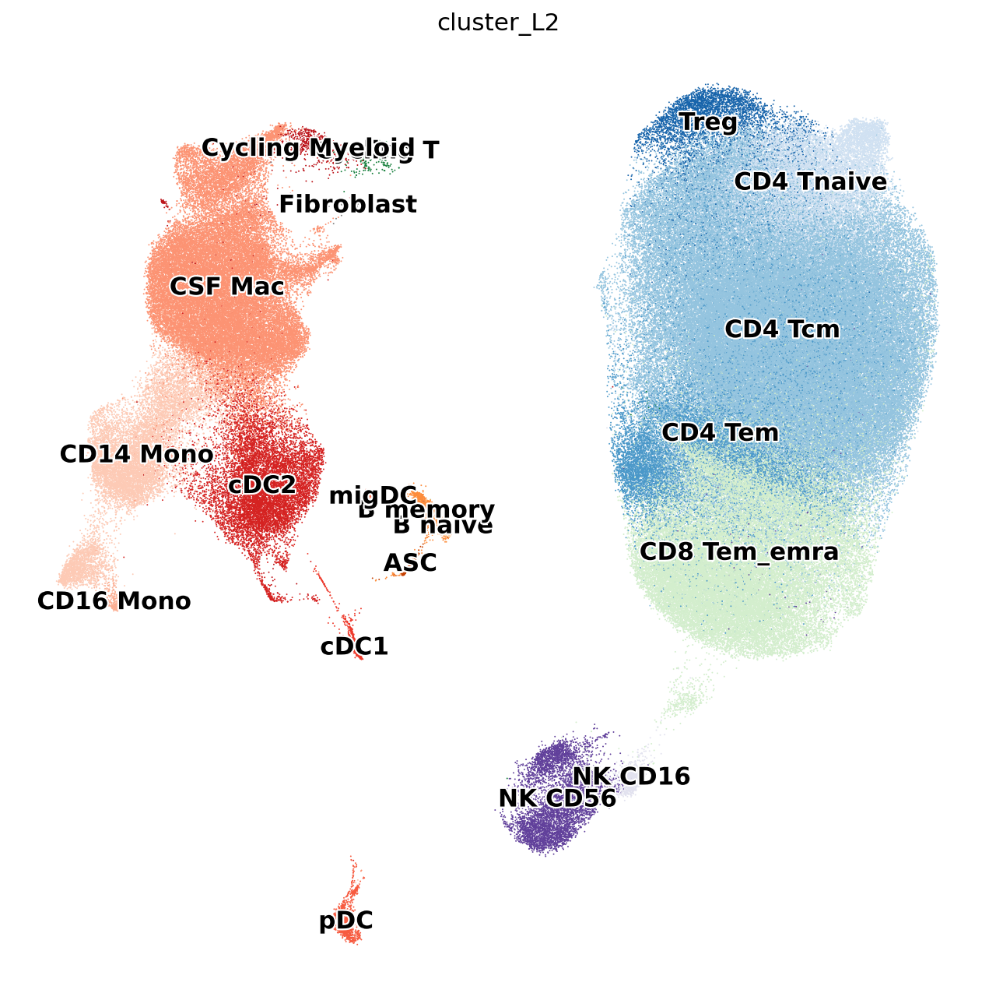

In [4]:
with plt.rc_context({"figure.figsize": (10, 10)}):
    sc.pl.embedding(
        adata,
        basis="umap_filtered",
        s=3,
        color="cluster_L2",
        legend_loc="on data",
        legend_fontsize=14,
        legend_fontoutline=2,
        frameon=False,
        # add_outline=True,
        # outline_width=(0.1, 5),
        # palette=cluster_palette,
        save='filter_reembed_cluster_L2_color_gradation.pdf'
    )

In [5]:
df_rbd = pd.read_excel('../data/CSF_cellfreq_clin_RBD_v2.xlsx')
df_rbd = df_rbd[['Subject', 'PD_Probability', 'Biomarkers_Positive']]

adata.obs = pd.merge(adata.obs.reset_index(), df_rbd, left_on='DonorID', right_on='Subject', how='left').set_index('index')
adata.obs['PD_Probability'] = adata.obs['PD_Probability'].astype(str)
adata.obs['Biomarkers_Positive'] = adata.obs['Biomarkers_Positive'].astype(str)

adata.obs['PD_Probability'] = (adata.obs['EnrollmentCategory'].astype(str) + '-' + adata.obs['PD_Probability']).str.replace('-nan', '')
adata.obs['Biomarkers_Positive'] = (adata.obs['EnrollmentCategory'].astype(str) + '-' + adata.obs['Biomarkers_Positive']).str.replace('-nan', '')

In [44]:
adata.write(results_file)
adata_cxg = sc.AnnData(adata.raw.X)
adata_cxg.obs = adata.obs
adata_cxg.obsm = adata.obsm
adata_cxg.var.index = adata.raw.var.index
adata_cxg.uns['cluster_L2_colors'] = adata.uns['cluster_L2_colors']
adata_cxg.write(results_file_cellxgene)

In [45]:
adata.obs.to_csv(f'../scanpy/{version}/obs.csv')

In [36]:
msigdb = dc.get_resource('MSigDB')
msigdb

,genesymbol,collection,geneset
0,MAFF,chemical_and_genetic_perturbations,BOYAULT_LIVER_CANCER_SUBCLASS_G56_DN
1,MAFF,chemical_and_genetic_perturbations,ELVIDGE_HYPOXIA_UP
2,MAFF,chemical_and_genetic_perturbations,NUYTTEN_NIPP1_TARGETS_DN
3,MAFF,immunesigdb,GSE17721_POLYIC_VS_GARDIQUIMOD_4H_BMDC_DN
4,MAFF,chemical_and_genetic_perturbations,SCHAEFFER_PROSTATE_DEVELOPMENT_12HR_UP
...,...,...,...
3838543,PRAMEF22,go_biological_process,GOBP_POSITIVE_REGULATION_OF_CELL_POPULATION_PR...
3838544,PRAMEF22,go_biological_process,GOBP_APOPTOTIC_PROCESS
3838545,PRAMEF22,go_biological_process,GOBP_REGULATION_OF_CELL_DEATH
3838546,PRAMEF22,go_biological_process,GOBP_NEGATIVE_REGULATION_OF_DEVELOPMENTAL_PROCESS


In [37]:
# Filter by hallmark
msigdb = msigdb[msigdb['collection']=='hallmark']

# Remove duplicated entries
msigdb = msigdb[~msigdb.duplicated(['geneset', 'genesymbol'])]
msigdb

,genesymbol,collection,geneset
233,MAFF,hallmark,HALLMARK_IL2_STAT5_SIGNALING
250,MAFF,hallmark,HALLMARK_COAGULATION
270,MAFF,hallmark,HALLMARK_HYPOXIA
373,MAFF,hallmark,HALLMARK_TNFA_SIGNALING_VIA_NFKB
377,MAFF,hallmark,HALLMARK_COMPLEMENT
...,...,...,...
1449668,STXBP1,hallmark,HALLMARK_PANCREAS_BETA_CELLS
1450315,ELP4,hallmark,HALLMARK_PANCREAS_BETA_CELLS
1450526,GCG,hallmark,HALLMARK_PANCREAS_BETA_CELLS
1450731,PCSK2,hallmark,HALLMARK_PANCREAS_BETA_CELLS


In [46]:
dc.run_ora(
    mat=adata,
    net=msigdb,
    source='geneset',
    target='genesymbol',
    verbose=True
)

Running ora on mat with 259560 samples and 24155 targets for 50 sources.


  0%|          | 0/259560 [00:00<?, ?it/s]

In [47]:
acts = dc.get_acts(adata, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

acts

AnnData object with n_obs × n_vars = 259560 × 50
    obs: 'cellranger_sample_id', 'SampleID', 'SampleType', 'DonorID', 'Estimated Number of Cells', 'Mean Reads per Cell', 'Median Genes per Cell', 'Number of Reads', 'Valid Barcodes', 'Sequencing Saturation', 'Q30 Bases in Barcode', 'Q30 Bases in RNA Read', 'Q30 Bases in UMI', 'Reads Mapped to Genome', 'Reads Mapped Confidently to Genome', 'Reads Mapped Confidently to Intergenic Regions', 'Reads Mapped Confidently to Intronic Regions', 'Reads Mapped Confidently to Exonic Regions', 'Reads Mapped Confidently to Transcriptome', 'Reads Mapped Antisense to Gene', 'Fraction Reads in Cells', 'Total Genes Detected', 'Median UMI Counts per Cell', 'Q30 Bases in RNA Read 2', 'chemistry', 'Visit', 'SubjectID', 'DateICFSigned', 'YearICFSigned', 'EnrollmentCategory', 'RBDY/N?', 'YearofRBDDx', 'RBDAAO', 'AgeRBDDx', 'RBDDxtoConesnt', 'PDY/N', 'Year1stPDSx', 'YearofPDDx', 'PDAAO', 'AgePDDx', 'PDDxtoConsent', 'DLBY/N', 'Year1stDLBSx', 'YearDLBDX', 'DLBAAO

In [48]:
acts.var.index = acts.var.index.astype(str)
acts.write(f'../scanpy/{version}/ora_hallmark.h5ad')

In [9]:
acts = sc.read(f'../scanpy/{version}/ora_hallmark.h5ad')

In [10]:
acts.var

""
source
HALLMARK_ADIPOGENESIS
HALLMARK_ALLOGRAFT_REJECTION
HALLMARK_ANDROGEN_RESPONSE
HALLMARK_ANGIOGENESIS
HALLMARK_APICAL_JUNCTION
HALLMARK_APICAL_SURFACE
HALLMARK_APOPTOSIS
HALLMARK_BILE_ACID_METABOLISM
HALLMARK_CHOLESTEROL_HOMEOSTASIS


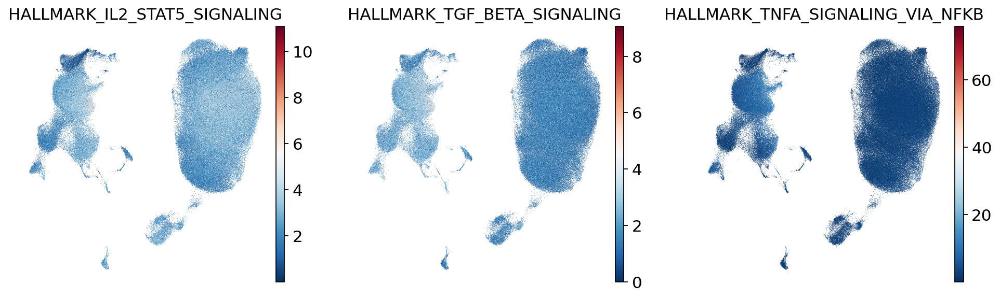

In [51]:
sc.pl.embedding(
        acts,
        basis="umap_filtered", 
        color=['HALLMARK_IL2_STAT5_SIGNALING',
        'HALLMARK_TGF_BETA_SIGNALING',
        'HALLMARK_TNFA_SIGNALING_VIA_NFKB',
        ], cmap='RdBu_r')

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_cluster_L2']`


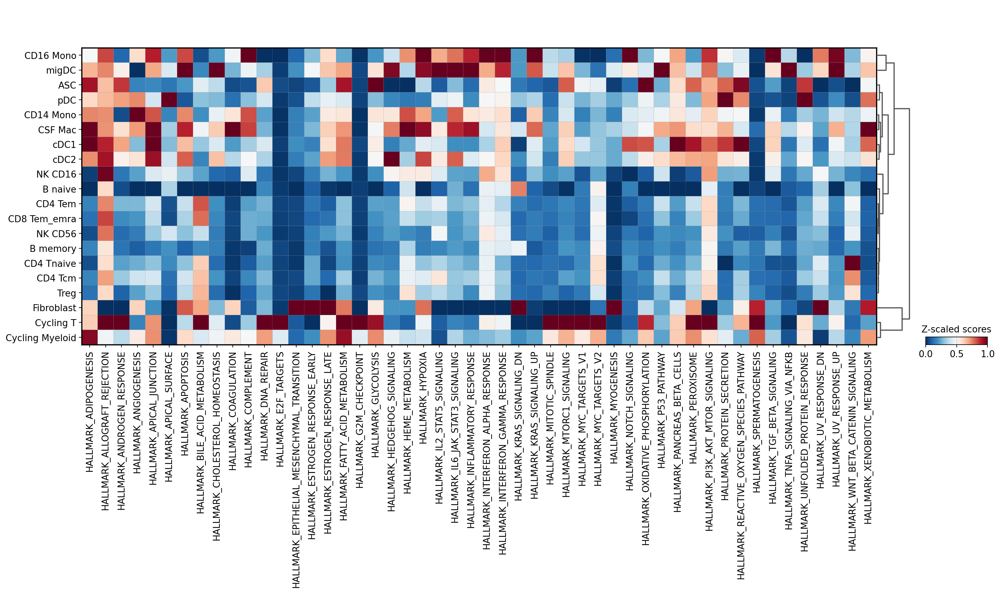

In [52]:
sc.pl.matrixplot(acts, var_names=acts.var_names, groupby='cluster_L2', dendrogram=True, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='RdBu_r')

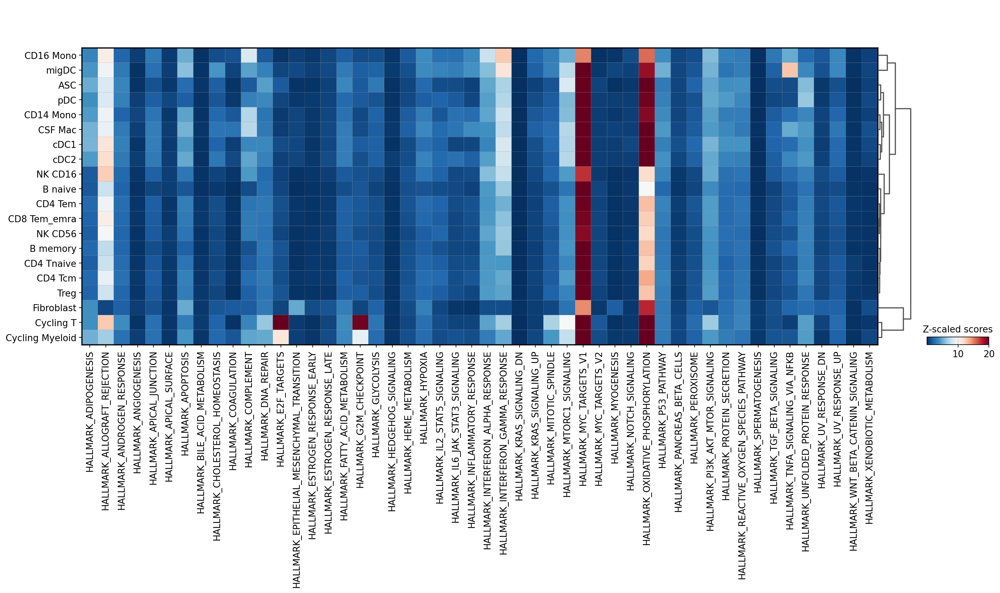

In [53]:
sc.pl.matrixplot(acts, var_names=acts.var_names, groupby='cluster_L2', dendrogram=True, vmax=20,
                 colorbar_title='Z-scaled scores', cmap='RdBu_r')

    using data matrix X directly
Storing dendrogram info using `.uns['dendrogram_EnrollmentCategory']`


/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/scanpy/tools/_dendrogram.py:193: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = dat


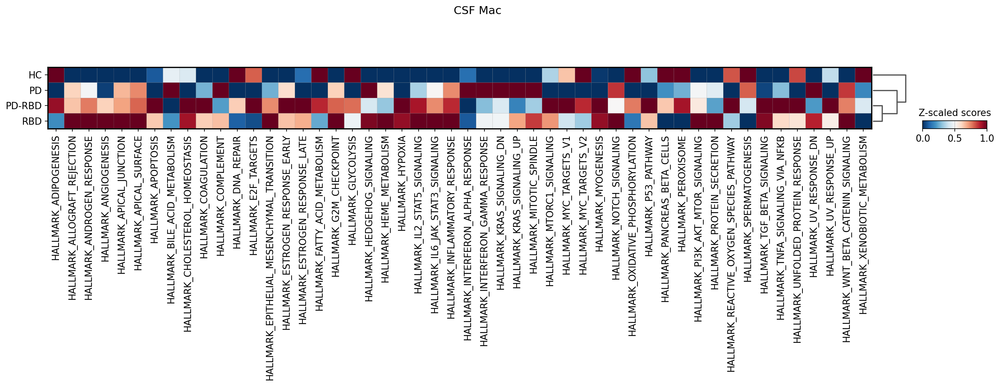

In [54]:
sc.pl.matrixplot(acts[acts.obs['cluster_L2']=='CSF Mac'], var_names=acts.var_names, 
groupby='EnrollmentCategory', dendrogram=True, standard_scale='var',
                 colorbar_title='Z-scaled scores', cmap='RdBu_r', title='CSF Mac')

In [56]:
list_res = []
for clu in adata.obs['cluster_L2'].cat.categories:
    d = dc.rank_sources_groups(acts[acts.obs['cluster_L2']==clu], groupby='PD_Probability', reference='HC', method='t-test_overestim_var')
    d['celltype'] = clu
    list_res.append(d)
df_res = pd.concat(list_res)
df_res.to_csv(f'../scanpy/{version}/graph/PD_Probability_significant_adjusted_pvalues_by_celltype.csv')

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freed

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


In [6]:
df_res = pd.read_csv(f'../scanpy/{version}/graph/PD_Probability_significant_adjusted_pvalues_by_celltype.csv', index_col=0)

In [7]:
list_celltypes_retain = list(adata.obs['cluster_L2'].value_counts()[adata.obs['cluster_L2'].value_counts() > 500].index)

In [8]:
import matplotlib.lines as mlines

In [24]:
list_res = []
for clu in adata.obs['cluster_L2'].cat.categories:
    d = dc.rank_sources_groups(acts[acts.obs['cluster_L2']==clu], groupby='EnrollmentCategory', reference='HC', method='t-test_overestim_var')
    d['celltype'] = clu
    list_res.append(d)
df_res = pd.concat(list_res)
df_res.to_csv(f'../scanpy/{version}/graph/significant_adjusted_pvalues_by_celltype_enrollmentcategory.csv')

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freed

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/numpy/core/_methods.py:198: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


In [9]:
df_res = pd.read_csv(f'../scanpy/241028_CSF_downstream/graph/significant_adjusted_pvalues_by_celltype_enrollmentcategory.csv', index_col=0)

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_3991373/3993090252.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_plot['neg_log10_pvals_adj'] = -np.log10(df_plot['pvals_adj'])
/tmp/ipykernel_3991373/3993090252.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_plot['neg_log10_pvals_adj'] = df_plot['neg_log10_p

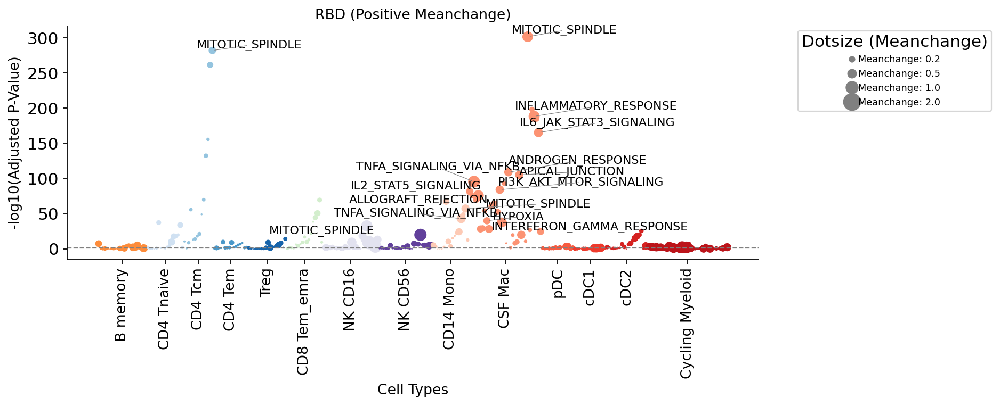

In [11]:
# for group in ['RBD', 'PD', 'PD-RBD']:

group = 'RBD'


df_plot = df_res[df_res['group'] == group]

df_plot['neg_log10_pvals_adj'] = -np.log10(df_plot['pvals_adj'])
# if meanchange is negative, we need to invert the p-value
df_plot['neg_log10_pvals_adj'] = df_plot['neg_log10_pvals_adj'] * np.sign(df_plot['meanchange'])

color_map = {
    'B naive': '#fdd9b4',
    'B memory': '#fd8c3b',
    'ASC': '#c54102',
    'CD4 Tnaive': '#d0e1f2',
    'CD4 Tcm': '#94c4df',
    'CD4 Tem': '#4a98c9',
    'Treg': '#1764ab',
    'CD8 Tem_emra': '#d3eecd',
    'Cycling T': '#157f3b',
    'NK CD16': '#e2e2ef',
    'NK CD56': '#61409b',
    'CD14 Mono': '#fdcab5',
    'CD16 Mono': '#fcaf93',
    'CSF Mac': '#fc9373',
    'migDC': '#fb7757',
    'pDC': '#f75b40',
    'cDC1': '#ee3a2c',
    'cDC2': '#d52221',
    'Cycling Myeloid': '#bc141a',
    'Fibroblast': '#808080'
}
df_plot = df_plot[df_plot['celltype'].isin(list_celltypes_retain)]
df_plot['celltype'] = pd.Categorical(df_plot['celltype'], 
    categories=[x for x in adata.obs['cluster_L2'].cat.categories if x in list_celltypes_retain], ordered=True)

df_plot = df_plot.sort_values('celltype')
df_plot['position'] = range(len(df_plot))

# Number of top hallmarks to label
top_n = 15  # For positive meanchange

df_plot['names'] = df_plot['names'].str.replace('HALLMARK_', '')

# Filter for positive meanchange
df_positive = df_plot[df_plot['meanchange'] > 0]

# Map positions to celltypes for x-axis labeling
df_positive = df_positive.sort_values('celltype')
df_positive['position'] = range(len(df_positive))


# Select top_n from positive meanchange
df_top_labels = df_positive[df_positive['meanchange']>0.2].nsmallest(top_n, 'pvals_adj')

# Get unique cell types and their approximate positions
celltype_positions = df_positive.groupby('celltype')['position'].median()

plt.figure(figsize=(12, 5))

# Plot data
for celltype, group_data in df_positive.groupby('celltype'):
    plt.scatter(
        group_data['position'],
        group_data['neg_log10_pvals_adj'],
        label=celltype,
        color=color_map.get(celltype, '#000000'),
        s=group_data['meanchange'] * 100,  # Use meanchange-based size
        alpha=1  # Add transparency for better visibility
    )

# Add FDR threshold line
plt.axhline(y=-np.log10(0.05), color='gray', linestyle='--', linewidth=1, label='FDR Threshold (0.05)')

# Add labels for top hallmarks
texts = []
for _, row in df_top_labels.iterrows():
    # Adjust text to match points
    texts.append(plt.text(
        row['position'],
        row['neg_log10_pvals_adj'],
        row['names'],
        fontsize=10,
        color='k',
        ha='center'  # Align center to avoid offset
    ))

adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5),
    expand_points=(2, 2),)

# Customize x-axis to show one label per celltype
plt.xticks(
    ticks=celltype_positions,
    labels=celltype_positions.index,
    rotation=90,
    fontsize=12
)

# Turn grid off
plt.grid(False)

# Final plot customization
plt.xlabel('Cell Types', fontsize=12)
plt.ylabel('-log10(Adjusted P-Value)', fontsize=12)
plt.title(f'{group} (Positive Meanchange)', fontsize=12)
# Create a custom legend for dotsize
dot_sizes = [20, 50, 100, 200]  # Example sizes for legend
size_labels = ['0.2', '0.5', '1.0', '2.0']  # Corresponding `meanchange` values
legend_handles = [
    mlines.Line2D([], [], color='gray', marker='o', linestyle='None', markersize=np.sqrt(size), label=f'Meanchange: {label}')
    for size, label in zip(dot_sizes, size_labels)
]
plt.legend(handles=legend_handles, title="Dotsize (Meanchange)", bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)

plt.tight_layout()
sns.despine()
plt.savefig(f'../scanpy/{version}/graph/hallmark_manhattan_enrollment_cat_{group}.v2.pdf', dpi=300, bbox_inches='tight')

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_3329610/1822744348.py:28: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  for celltype, group_data in df_positive.groupby('celltype'):
/tmp/ipykernel_3329610/1822744348.py:37: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  celltype_ticks = df_positive.groupby('celltype')['position'].median()
/tmp/ipykernel_3329610/1822744348.py:46: FutureWarning: The default of observed=False is d

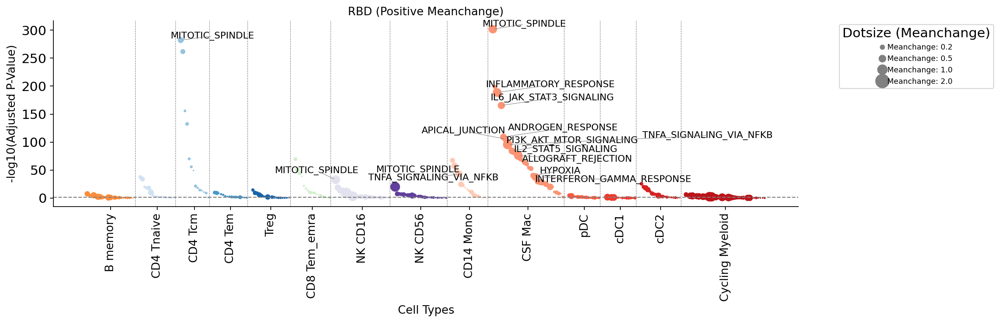

In [17]:
group = 'RBD'
df_plot = df_res[df_res['group'] == group].copy()

# Calculate -log10 adjusted p-values and set sign by meanchange
df_plot['neg_log10_pvals_adj'] = -np.log10(df_plot['pvals_adj']) * np.sign(df_plot['meanchange'])

# Filter relevant celltypes
df_plot = df_plot[df_plot['celltype'].isin(list_celltypes_retain)]
df_plot['celltype'] = pd.Categorical(
    df_plot['celltype'],
    categories=[x for x in adata.obs['cluster_L2'].cat.categories if x in list_celltypes_retain],
    ordered=True
)

# Remove 'HALLMARK_' prefix from names
df_plot['names'] = df_plot['names'].str.replace('HALLMARK_', '', regex=False)

# Keep only positive meanchange rows
df_positive = df_plot[df_plot['meanchange'] > 0].copy()
df_positive = df_positive.sort_values(['celltype', 'pvals_adj'])

# Assign x-axis positions with gaps between celltypes
gap = 2
position = 0
new_positions = []
celltype_boundaries = []

for celltype, group_data in df_positive.groupby('celltype'):
    n = len(group_data)
    new_positions.extend(range(position, position + n))
    celltype_boundaries.append(position + n - 0.5)
    position += n + gap

df_positive['position'] = new_positions

# Determine median positions for each celltype to place x-axis labels
celltype_ticks = df_positive.groupby('celltype')['position'].median()

# Select top_n hallmark labels by adjusted p-value (for labels only)
top_n = 15
df_top_labels = df_positive[df_positive['meanchange'] > 0.2].nsmallest(top_n, 'pvals_adj')
# df_top_labels = df_top_labels.merge(df_positive[['names', 'position']], on='names', how='left')

# Plotting
plt.figure(figsize=(15, 5))
for celltype, group_data in df_positive.groupby('celltype'):
    plt.scatter(
        group_data['position'],
        group_data['neg_log10_pvals_adj'],
        label=celltype,
        color=color_map.get(celltype, '#000000'),
        s=group_data['meanchange'] * 100,
        alpha=1
    )

# Add FDR threshold line
plt.axhline(y=-np.log10(0.05), color='gray', linestyle='--', linewidth=1, label='FDR Threshold (0.05)')

# Add celltype boundary lines
for boundary in celltype_boundaries[:-1]:
    plt.axvline(x=boundary, color='gray', linestyle='--', linewidth=0.5)

# Add hallmark text labels
texts = []
for _, row in df_top_labels.iterrows():
    texts.append(plt.text(
        row['position'],
        row['neg_log10_pvals_adj'],
        row['names'],
        fontsize=10,
        color='k',
        ha='center'
    ))

adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5), expand_points=(2, 2))

# X-axis ticks with celltype names
plt.xticks(
    ticks=celltype_ticks,
    labels=celltype_ticks.index,
    rotation=90,
    fontsize=12
)

plt.xlabel('Cell Types', fontsize=12)
plt.ylabel('-log10(Adjusted P-Value)', fontsize=12)
plt.title(f'{group} (Positive Meanchange)', fontsize=12)

# Create a dot size legend
dot_sizes = [20, 50, 100, 200]
size_labels = ['0.2', '0.5', '1.0', '2.0']
legend_handles = [
    mlines.Line2D([], [], color='gray', marker='o', linestyle='None',
                  markersize=np.sqrt(size), label=f'Meanchange: {label}')
    for size, label in zip(dot_sizes, size_labels)
]
plt.legend(handles=legend_handles, title="Dotsize (Meanchange)",
           bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)

plt.tight_layout()
sns.despine()
plt.grid(False)

# Save figure
plt.savefig(f'../scanpy/{version}/graph/hallmark_manhattan_enrollment_cat_{group}.v2.pdf',
            dpi=300, bbox_inches='tight')

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_3329610/358671870.py:22: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_positive = df_positive.groupby('celltype', group_keys=False).apply(lambda x: x.sample(frac=1, random_state=42)).reset_index(drop=True)
/tmp/ipykernel_3329610/358671870.py:22: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silenc

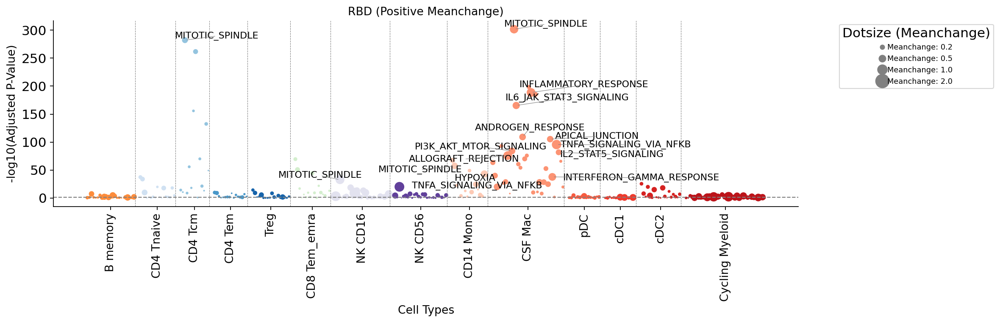

In [31]:
group = 'RBD'
df_plot = df_res[df_res['group'] == group].copy()

# Calculate -log10 adjusted p-values and set sign by meanchange
df_plot['neg_log10_pvals_adj'] = -np.log10(df_plot['pvals_adj']) * np.sign(df_plot['meanchange'])

# Filter relevant celltypes
df_plot = df_plot[df_plot['celltype'].isin(list_celltypes_retain)]
df_plot['celltype'] = pd.Categorical(
    df_plot['celltype'],
    categories=pd.unique(df_plot['celltype']),  # 現れた順
    ordered=True
)

# Remove 'HALLMARK_' prefix from names
df_plot['names'] = df_plot['names'].str.replace('HALLMARK_', '', regex=False)

# Keep only positive meanchange rows
df_positive = df_plot[df_plot['meanchange'] > 0].copy()
# df_positive = df_positive.sort_values(['celltype', 'pvals_adj'])
# Shuffle rows within each celltype group
df_positive = df_positive.groupby('celltype', group_keys=False).apply(lambda x: x.sample(frac=1, random_state=42)).reset_index(drop=True)

# Assign x-axis positions with gaps between celltypes
gap = 2
position = 0
new_positions = []
celltype_boundaries = []

for celltype, group_data in df_positive.groupby('celltype', sort=False):
    n = len(group_data)
    new_positions.extend(range(position, position + n))
    celltype_boundaries.append(position + n - 0.5)
    position += n + gap

df_positive['position'] = new_positions

# Calculate ticks as median position for each celltype
celltype_ticks = df_positive.groupby('celltype')['position'].median()

# Select top_n labels again from unsorted df_positive
df_top_labels = df_positive[df_positive['meanchange'] > 0.2].nsmallest(top_n, 'pvals_adj')

# Plotting
plt.figure(figsize=(15, 5))
for celltype, group_data in df_positive.groupby('celltype'):
    plt.scatter(
        group_data['position'],
        group_data['neg_log10_pvals_adj'],
        label=celltype,
        color=color_map.get(celltype, '#000000'),
        s=group_data['meanchange'] * 100,
        alpha=1
    )

# Add FDR threshold line
plt.axhline(y=-np.log10(0.05), color='gray', linestyle='--', linewidth=1, label='FDR Threshold (0.05)')

# Add celltype boundary lines
for boundary in celltype_boundaries[:-1]:
    plt.axvline(x=boundary, color='gray', linestyle='--', linewidth=0.5)

# Add hallmark text labels
texts = []
for _, row in df_top_labels.iterrows():
    texts.append(plt.text(
        row['position'],
        row['neg_log10_pvals_adj'],
        row['names'],
        fontsize=10,
        color='k',
        ha='center'
    ))

adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5), expand_points=(2, 2))

# X-axis ticks with celltype names
plt.xticks(
    ticks=celltype_ticks,
    labels=celltype_ticks.index,
    rotation=90,
    fontsize=12
)

plt.xlabel('Cell Types', fontsize=12)
plt.ylabel('-log10(Adjusted P-Value)', fontsize=12)
plt.title(f'{group} (Positive Meanchange)', fontsize=12)

# Create a dot size legend
dot_sizes = [20, 50, 100, 200]
size_labels = ['0.2', '0.5', '1.0', '2.0']
legend_handles = [
    mlines.Line2D([], [], color='gray', marker='o', linestyle='None',
                  markersize=np.sqrt(size), label=f'Meanchange: {label}')
    for size, label in zip(dot_sizes, size_labels)
]
plt.legend(handles=legend_handles, title="Dotsize (Meanchange)",
           bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)

plt.tight_layout()
sns.despine()
plt.grid(False)

# Save figure
plt.savefig(f'../scanpy/{version}/graph/hallmark_manhattan_enrollment_cat_{group}.v3.pdf',
            dpi=300, bbox_inches='tight')

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
/tmp/ipykernel_3991373/2889654762.py:23: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_positive = df_positive.groupby('celltype', group_keys=False).apply(
/tmp/ipykernel_3991373/2889654762.py:23: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_positive = df_positive.groupby('celltype', g

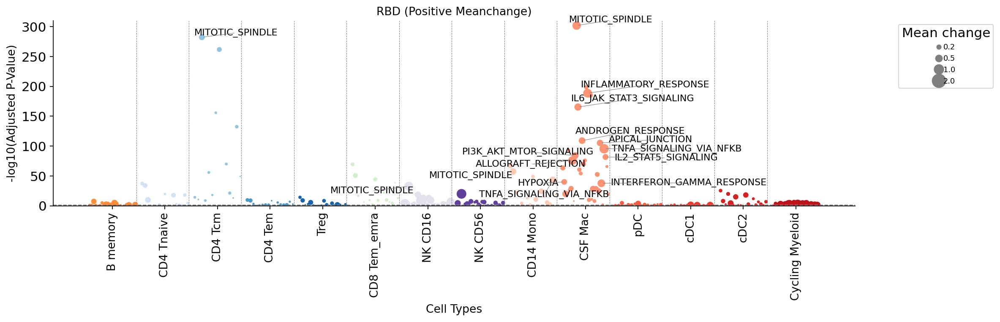

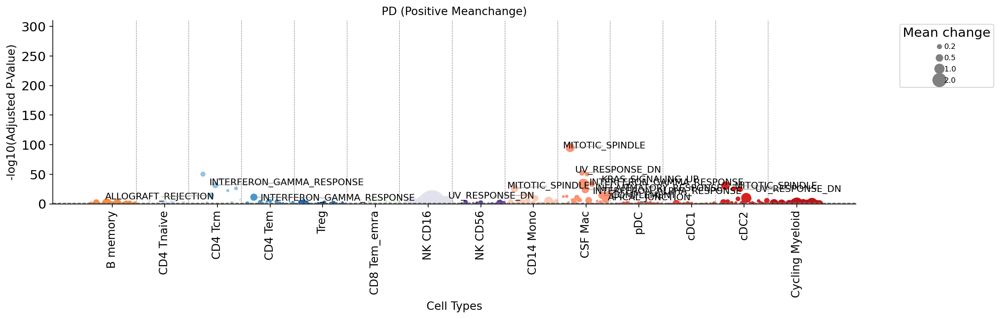

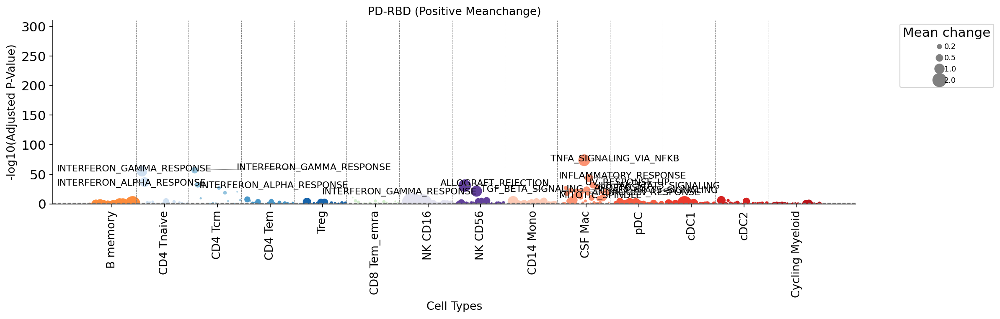

In [15]:
# group = 'RBD'
for group in ['RBD', 'PD', 'PD-RBD']:
    df_plot = df_res[df_res['group'] == group].copy()

    # Calculate -log10 adjusted p-values and set sign by meanchange
    df_plot['neg_log10_pvals_adj'] = -np.log10(df_plot['pvals_adj']) * np.sign(df_plot['meanchange'])

    # Filter relevant celltypes
    df_plot = df_plot[df_plot['celltype'].isin(list_celltypes_retain)]
    df_plot['celltype'] = pd.Categorical(
        df_plot['celltype'],
        categories=pd.unique(df_plot['celltype']),
        ordered=True
    )

    # Remove 'HALLMARK_' prefix from names
    df_plot['names'] = df_plot['names'].str.replace('HALLMARK_', '', regex=False)

    # Keep only positive meanchange rows
    df_positive = df_plot[df_plot['meanchange'] > 0].copy()

    # Shuffle rows within each celltype group
    df_positive = df_positive.groupby('celltype', group_keys=False).apply(
        lambda x: x.sample(frac=1, random_state=42)
    ).reset_index(drop=True)

    # Assign x-axis positions with equal width per celltype
    slots_per_celltype = 20  # Equal width for each celltype block
    gap = 2
    start_position = 0
    celltype_boundaries = []
    celltype_ticks = {}

    for celltype in df_positive['celltype'].unique():
        mask = df_positive['celltype'] == celltype
        n = mask.sum()
        indices = np.linspace(start_position, start_position + slots_per_celltype - 1, n)
        df_positive.loc[mask, 'position'] = indices
        celltype_boundaries.append(start_position + slots_per_celltype - 0.5)
        celltype_ticks[celltype] = start_position + (slots_per_celltype - 1) / 2
        start_position += slots_per_celltype + gap

    celltype_ticks = pd.Series(celltype_ticks)

    # Select top_n labels again from shuffled df_positive
    top_n = 15
    df_top_labels = df_positive[df_positive['meanchange'] > 0.2].nsmallest(top_n, 'pvals_adj')

    # Plotting
    plt.figure(figsize=(15, 5))
    for celltype, group_data in df_positive.groupby('celltype'):
        plt.scatter(
            group_data['position'],
            group_data['neg_log10_pvals_adj'],
            label=celltype,
            color=color_map.get(celltype, '#000000'),
            s=group_data['meanchange'] * 100,
            alpha=1
        )

    # Add FDR threshold line
    plt.axhline(y=-np.log10(0.05), color='gray', linestyle='--', linewidth=1, label='FDR Threshold (0.05)')

    # Add celltype boundary lines
    for boundary in celltype_boundaries[:-1]:
        plt.axvline(x=boundary, color='gray', linestyle='--', linewidth=0.5)

    # Add hallmark text labels
    texts = []
    for _, row in df_top_labels.iterrows():
        texts.append(plt.text(
            row['position'],
            row['neg_log10_pvals_adj'],
            row['names'],
            fontsize=10,
            color='k',
            ha='center'
        ))

    adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray', lw=0.5), expand_points=(2, 2))

    # X-axis ticks with celltype names
    plt.xticks(
        ticks=celltype_ticks,
        labels=celltype_ticks.index,
        rotation=90,
        fontsize=12
    )

    plt.xlabel('Cell Types', fontsize=12)
    plt.ylabel('-log10(Adjusted P-Value)', fontsize=12)
    plt.title(f'{group} (Positive Meanchange)', fontsize=12)

    # Create a dot size legend
    dot_sizes = [20, 50, 100, 200]
    size_labels = ['0.2', '0.5', '1.0', '2.0']
    legend_handles = [
        mlines.Line2D([], [], color='gray', marker='o', linestyle='None',
                    markersize=np.sqrt(size), label=f'{label}')
        for size, label in zip(dot_sizes, size_labels)
    ]
    plt.legend(handles=legend_handles, title="Mean change",
            bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)

    plt.tight_layout()
    sns.despine()
    plt.grid(False)
    plt.ylim(0,310)

    # Save figure
    plt.savefig(f'../scanpy/{version}/graph/hallmark_manhattan_enrollment_cat_{group}.v5.pdf',
                dpi=300, bbox_inches='tight')

In [7]:
adata

AnnData object with n_obs × n_vars = 259560 × 24155
    obs: 'cellranger_sample_id', 'SampleID', 'SampleType', 'DonorID', 'Estimated Number of Cells', 'Mean Reads per Cell', 'Median Genes per Cell', 'Number of Reads', 'Valid Barcodes', 'Sequencing Saturation', 'Q30 Bases in Barcode', 'Q30 Bases in RNA Read', 'Q30 Bases in UMI', 'Reads Mapped to Genome', 'Reads Mapped Confidently to Genome', 'Reads Mapped Confidently to Intergenic Regions', 'Reads Mapped Confidently to Intronic Regions', 'Reads Mapped Confidently to Exonic Regions', 'Reads Mapped Confidently to Transcriptome', 'Reads Mapped Antisense to Gene', 'Fraction Reads in Cells', 'Total Genes Detected', 'Median UMI Counts per Cell', 'Q30 Bases in RNA Read 2', 'chemistry', 'Visit', 'SubjectID', 'DateICFSigned', 'YearICFSigned', 'EnrollmentCategory', 'RBDY/N?', 'YearofRBDDx', 'RBDAAO', 'AgeRBDDx', 'RBDDxtoConesnt', 'PDY/N', 'Year1stPDSx', 'YearofPDDx', 'PDAAO', 'AgePDDx', 'PDDxtoConsent', 'DLBY/N', 'Year1stDLBSx', 'YearDLBDX', 'DLB

In [8]:
adata.obs['cluster_L2'].cat.categories

Index(['B naive', 'B memory', 'ASC', 'CD4 Tnaive', 'CD4 Tcm', 'CD4 Tem',
       'Treg', 'CD8 Tem_emra', 'Cycling T', 'NK CD16', 'NK CD56', 'CD14 Mono',
       'CD16 Mono', 'CSF Mac', 'migDC', 'pDC', 'cDC1', 'cDC2',
       'Cycling Myeloid', 'Fibroblast'],
      dtype='object')

In [12]:
acts.obs['PD_Probability'].unique()

['HC', 'RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD']
Categories (5, object): ['HC', 'PD', 'PD-RBD', 'RBD-High', 'RBD-LowIntm']

/tmp/ipykernel_3793418/2451330201.py:10: UserWarning: The palette list has more values (6) than needed (5), which may not be intended.
  sns.boxplot(d_donor, x='PD_Probability', y=path, hue='PD_Probability', boxprops=dict(alpha=1), showfliers=False,


,pvals,cat,pvals_adj
0,0.001223,RBD-LowIntm,0.004891
1,0.058224,RBD-High,0.116448
2,0.470486,PD,0.470486
3,0.430290,PD-RBD,0.470486


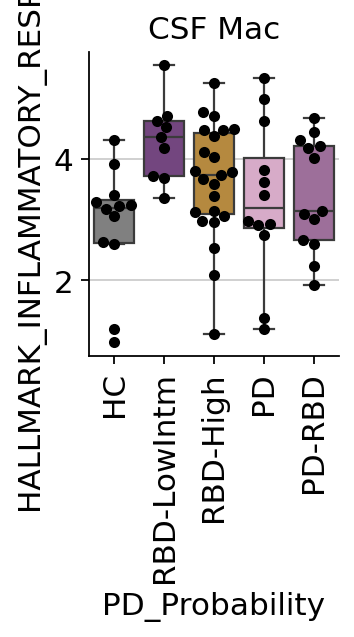

In [19]:
path = 'HALLMARK_INFLAMMATORY_RESPONSE'
clu = 'CSF Mac'

d = sc.get.obs_df(acts[acts.obs['cluster_L2']==clu], keys=['PD_Probability', 'DonorID', path])
d_donor = pd.merge(d[['DonorID', path]].groupby(by='DonorID').mean(), d[['DonorID', 'PD_Probability']].drop_duplicates(), on='DonorID')
d_donor['PD_Probability'] = d_donor['PD_Probability'].astype('category')
d_donor['PD_Probability'] = d_donor['PD_Probability'].cat.reorder_categories(['HC', 'RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD'])
plt.figure(figsize=(2,2.5))
sns.swarmplot(d_donor, x='PD_Probability', y=path, color='black')
sns.boxplot(d_donor, x='PD_Probability', y=path, hue='PD_Probability', boxprops=dict(alpha=1), showfliers=False,
palette=["gray", "#793C89", "#C98E2B", "#DEA4CA", "#A567A1", "#595996"])
plt.title(clu)
plt.xticks(rotation=90)
sns.despine()
plt.savefig(f'{sc.settings.figdir}/Hallmark_samplewise/Diagnosis_PDProb_{clu}_{path}.pdf', bbox_inches='tight')

# perform Mann-Whitney U test
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

pvals = []
for cat in ['RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD']:
    pvals.append(mannwhitneyu(d_donor[d_donor['PD_Probability']==cat][path], d_donor[d_donor['PD_Probability']=='HC'][path])[1])

df_pvals = pd.DataFrame({'pvals': pvals, 'cat': ['RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD']})
df_pvals['pvals_adj'] = multipletests(df_pvals['pvals'], method='fdr_bh')[1]
df_pvals

/tmp/ipykernel_3793418/1369289532.py:10: UserWarning: The palette list has more values (6) than needed (5), which may not be intended.
  sns.boxplot(d_donor, x='PD_Probability', y=path, hue='PD_Probability', boxprops=dict(alpha=1), showfliers=False,
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning: 13.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


,pvals,cat,pvals_adj
0,0.014214,RBD-LowIntm,0.056856
1,0.305271,RBD-High,0.573720
2,0.750832,PD,0.750832
3,0.430290,PD-RBD,0.573720


/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning: 13.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


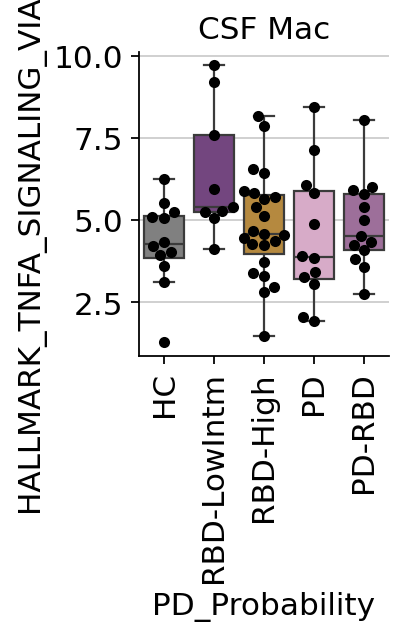

In [20]:
path = 'HALLMARK_TNFA_SIGNALING_VIA_NFKB'
clu = 'CSF Mac'

d = sc.get.obs_df(acts[acts.obs['cluster_L2']==clu], keys=['PD_Probability', 'DonorID', path])
d_donor = pd.merge(d[['DonorID', path]].groupby(by='DonorID').mean(), d[['DonorID', 'PD_Probability']].drop_duplicates(), on='DonorID')
d_donor['PD_Probability'] = d_donor['PD_Probability'].astype('category')
d_donor['PD_Probability'] = d_donor['PD_Probability'].cat.reorder_categories(['HC', 'RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD'])
plt.figure(figsize=(2,2.5))
sns.swarmplot(d_donor, x='PD_Probability', y=path, color='black')
sns.boxplot(d_donor, x='PD_Probability', y=path, hue='PD_Probability', boxprops=dict(alpha=1), showfliers=False,
palette=["gray", "#793C89", "#C98E2B", "#DEA4CA", "#A567A1", "#595996"])
plt.title(clu)
plt.xticks(rotation=90)
sns.despine()
plt.savefig(f'{sc.settings.figdir}/Hallmark_samplewise/Diagnosis_PDProb_{clu}_{path}.pdf', bbox_inches='tight')

# perform Mann-Whitney U test
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

pvals = []
for cat in ['RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD']:
    pvals.append(mannwhitneyu(d_donor[d_donor['PD_Probability']==cat][path], d_donor[d_donor['PD_Probability']=='HC'][path])[1])

df_pvals = pd.DataFrame({'pvals': pvals, 'cat': ['RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD']})
df_pvals['pvals_adj'] = multipletests(df_pvals['pvals'], method='fdr_bh')[1]
df_pvals

/tmp/ipykernel_3793418/4123307937.py:10: UserWarning: The palette list has more values (6) than needed (5), which may not be intended.
  sns.boxplot(d_donor, x='PD_Probability', y=path, hue='PD_Probability', boxprops=dict(alpha=1), showfliers=False,
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning: 8.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


,pvals,cat,pvals_adj
0,0.014214,RBD-LowIntm,0.028428
1,0.005149,RBD-High,0.020596
2,0.402504,PD,0.402504
3,0.134705,PD-RBD,0.179607


/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning: 8.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


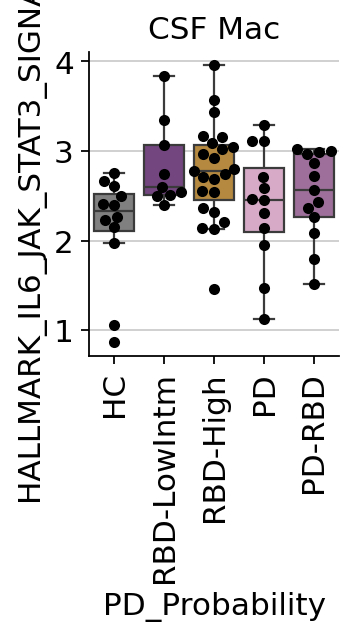

In [21]:
path = 'HALLMARK_IL6_JAK_STAT3_SIGNALING'
clu = 'CSF Mac'

d = sc.get.obs_df(acts[acts.obs['cluster_L2']==clu], keys=['PD_Probability', 'DonorID', path])
d_donor = pd.merge(d[['DonorID', path]].groupby(by='DonorID').mean(), d[['DonorID', 'PD_Probability']].drop_duplicates(), on='DonorID')
d_donor['PD_Probability'] = d_donor['PD_Probability'].astype('category')
d_donor['PD_Probability'] = d_donor['PD_Probability'].cat.reorder_categories(['HC', 'RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD'])
plt.figure(figsize=(2,2.5))
sns.swarmplot(d_donor, x='PD_Probability', y=path, color='black')
sns.boxplot(d_donor, x='PD_Probability', y=path, hue='PD_Probability', boxprops=dict(alpha=1), showfliers=False,
palette=["gray", "#793C89", "#C98E2B", "#DEA4CA", "#A567A1", "#595996"])
plt.title(clu)
plt.xticks(rotation=90)
sns.despine()
plt.savefig(f'{sc.settings.figdir}/Hallmark_samplewise/Diagnosis_PDProb_{clu}_{path}.pdf', bbox_inches='tight')

# perform Mann-Whitney U test
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

pvals = []
for cat in ['RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD']:
    pvals.append(mannwhitneyu(d_donor[d_donor['PD_Probability']==cat][path], d_donor[d_donor['PD_Probability']=='HC'][path])[1])

df_pvals = pd.DataFrame({'pvals': pvals, 'cat': ['RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD']})
df_pvals['pvals_adj'] = multipletests(df_pvals['pvals'], method='fdr_bh')[1]
df_pvals

In [37]:
os.makedirs(f'{sc.settings.figdir}/Hallmark_samplewise', exist_ok=True)

list_res_samplewise = []
for path in acts.var_names:
    # for clu in adata.obs['cluster_L2'].cat.categories:
    for clu in list_celltypes_retain:
        d = sc.get.obs_df(acts[acts.obs['cluster_L2']==clu], keys=['EnrollmentCategory', 'DonorID', path])
        d_donor = pd.merge(d[['DonorID', path]].groupby(by='DonorID').mean(), d[['DonorID', 'EnrollmentCategory']].drop_duplicates(), on='DonorID')
        d_donor['EnrollmentCategory'] = d_donor['EnrollmentCategory'].astype('category')
        try:
            d_donor['EnrollmentCategory'] = d_donor['EnrollmentCategory'].cat.reorder_categories(['HC', 'RBD', 'PD', 'PD-RBD'])
        except:
            continue
    
        sns.swarmplot(d_donor, x='EnrollmentCategory', y=path, color='black')
        sns.boxplot(d_donor, x='EnrollmentCategory', y=path, hue='EnrollmentCategory', boxprops=dict(alpha=.3), showfliers=False)
        plt.title(clu)
        plt.xticks(rotation=90)
        sns.despine()
        plt.savefig(f'{sc.settings.figdir}/Hallmark_samplewise/Diagnosis_EnrollmentCat_{clu}_{path}.pdf', bbox_inches='tight')
        plt.close()

        # perform Mann-Whitney U test
        from scipy.stats import mannwhitneyu
        from statsmodels.stats.multitest import multipletests

        pvals = []
        for cat in ['RBD', 'PD', 'PD-RBD']:
            pvals.append(mannwhitneyu(d_donor[d_donor['EnrollmentCategory']==cat][path], d_donor[d_donor['EnrollmentCategory']=='HC'][path])[1])

        df_pvals = pd.DataFrame({'pvals': pvals, 'cat': ['RBD', 'PD', 'PD-RBD']})
        df_pvals['pvals_adj'] = multipletests(df_pvals['pvals'], method='fdr_bh')[1]
        df_pvals['path'] = path
        df_pvals['celltype'] = clu
        list_res_samplewise.append(df_pvals)

df_res_samplewise = pd.concat(list_res_samplewise)
df_res_samplewise.to_csv(f'{sc.settings.figdir}/Hallmark_samplewise/df_res_samplewise_enrollmentcat.csv')

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning: 6.5% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning: 28.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning: 6.5% of the points cannot be placed; you may want to decrease the size o

In [38]:
df_res_samplewise.sort_values(by='pvals_adj').head(60)

,pvals,cat,pvals_adj,path,celltype
1,0.000731,PD,0.002194,HALLMARK_COAGULATION,CD4 Tcm
0,0.002337,RBD,0.007011,HALLMARK_IL6_JAK_STAT3_SIGNALING,CSF Mac
2,0.005091,PD-RBD,0.007636,HALLMARK_COAGULATION,CD4 Tcm
0,0.005514,RBD,0.008272,HALLMARK_FATTY_ACID_METABOLISM,CD4 Tem
1,0.005073,PD,0.008272,HALLMARK_FATTY_ACID_METABOLISM,CD4 Tem
1,0.003462,PD,0.010386,HALLMARK_PEROXISOME,CD4 Tnaive
0,0.003592,RBD,0.010776,HALLMARK_HEDGEHOG_SIGNALING,CSF Mac
0,0.003592,RBD,0.010776,HALLMARK_HEME_METABOLISM,CSF Mac
0,0.007652,RBD,0.011478,HALLMARK_PEROXISOME,CD4 Tnaive
0,0.007058,RBD,0.012508,HALLMARK_APOPTOSIS,CD4 Tnaive


In [67]:
os.makedirs(f'{sc.settings.figdir}/Hallmark_samplewise', exist_ok=True)

list_res_samplewise = []
for path in acts.var_names:
    # for clu in adata.obs['cluster_L2'].cat.categories:
    for clu in list_celltypes_retain:
        d = sc.get.obs_df(acts[acts.obs['cluster_L2']==clu], keys=['PD_Probability', 'DonorID', path])
        d_donor = pd.merge(d[['DonorID', path]].groupby(by='DonorID').mean(), d[['DonorID', 'PD_Probability']].drop_duplicates(), on='DonorID')
        d_donor['PD_Probability'] = d_donor['PD_Probability'].astype('category')
        try:
            d_donor['PD_Probability'] = d_donor['PD_Probability'].cat.reorder_categories(['HC', 'RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD'])
        except:
            continue
    
        sns.swarmplot(d_donor, x='PD_Probability', y=path, color='black')
        sns.boxplot(d_donor, x='PD_Probability', y=path, hue='PD_Probability', boxprops=dict(alpha=.3), showfliers=False)
        plt.title(clu)
        plt.xticks(rotation=90)
        sns.despine()
        plt.savefig(f'{sc.settings.figdir}/Hallmark_samplewise/PD_Probability_{clu}_{path}.pdf', bbox_inches='tight')
        plt.close()

        # perform Mann-Whitney U test
        from scipy.stats import mannwhitneyu
        from statsmodels.stats.multitest import multipletests

        pvals = []
        for cat in ['RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD']:
            pvals.append(mannwhitneyu(d_donor[d_donor['PD_Probability']==cat][path], d_donor[d_donor['PD_Probability']=='HC'][path])[1])

        df_pvals = pd.DataFrame({'pvals': pvals, 'cat': ['RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD']})
        df_pvals['pvals_adj'] = multipletests(df_pvals['pvals'], method='fdr_bh')[1]
        df_pvals['path'] = path
        df_pvals['celltype'] = clu
        list_res_samplewise.append(df_pvals)

df_res_samplewise = pd.concat(list_res_samplewise)
df_res_samplewise.to_csv(f'{sc.settings.figdir}/Hallmark_samplewise/df_res_samplewise.csv')

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning: 9.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning: 5.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning: 5.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/seaborn/categorical.py:3399: UserWarning: 8.3% of the points cannot be placed; you may want to decrease the size of 

In [68]:
df_res_samplewise.sort_values(by='pvals_adj').head(60)


,pvals,cat,pvals_adj,path,celltype
2,0.000731,PD,0.002926,HALLMARK_COAGULATION,CD4 Tcm
0,0.001223,RBD-LowIntm,0.004891,HALLMARK_INFLAMMATORY_RESPONSE,CSF Mac
0,0.001223,RBD-LowIntm,0.004891,HALLMARK_MITOTIC_SPINDLE,CSF Mac
0,0.001564,RBD-LowIntm,0.006257,HALLMARK_UV_RESPONSE_DN,CSF Mac
0,0.001564,RBD-LowIntm,0.006257,HALLMARK_KRAS_SIGNALING_UP,CSF Mac
0,0.001992,RBD-LowIntm,0.007968,HALLMARK_DNA_REPAIR,CSF Mac
0,0.001992,RBD-LowIntm,0.007968,HALLMARK_TGF_BETA_SIGNALING,CSF Mac
1,0.002062,RBD-High,0.008247,HALLMARK_APOPTOSIS,CD4 Tnaive
0,0.002525,RBD-LowIntm,0.010100,HALLMARK_HEDGEHOG_SIGNALING,CSF Mac
3,0.005091,PD-RBD,0.010182,HALLMARK_COAGULATION,CD4 Tcm


In [5]:
adata.obs['group'] = adata.obs['EnrollmentCategory']

In [ ]:
from adjustText import adjust_text

th_padj = 1e-2
th_padj_plot = 1e-200
th_lfc = 0.2
th_mean = 0.5
n_top = 50

for clu in adata.obs['cluster_L2'].unique():
    a = adata[adata.obs['cluster_L2'] == clu].copy()
    
    for dis in ['RBD', 'PD', 'PD-RBD']:
        a_dis = a[a.obs.group.isin(['HC', dis])].copy()
        sc.tl.rank_genes_groups(a_dis, "group")

        d = sc.get.rank_genes_groups_df(a_dis, dis)

        d['neg_log10_pvals_adj'] = -np.log10(d['pvals_adj'].clip(lower=th_padj_plot))
        d['mean'] = list(a_dis.to_df().mean().loc[d.names])
        d.to_csv(f'../scanpy/{version}/graph/deg_{clu}_group_{dis}.csv')
        d = d[d['mean'] > th_mean]
        
        plt.figure(figsize=(10, 6))
        plt.scatter(d['logfoldchanges'], d['neg_log10_pvals_adj'], color='grey', alpha=0.5)
        
        deg = d[(d['pvals_adj'] < th_padj) & (abs(d['logfoldchanges']) > th_lfc)]
        plt.scatter(deg['logfoldchanges'], deg['neg_log10_pvals_adj'], color='red')
        
        deg_text = deg.loc[deg.scores.abs().nlargest(n_top).index]
        texts = [plt.text(row['logfoldchanges'], row['neg_log10_pvals_adj'], row['names'], ha='right') for index, row in deg_text.iterrows()]
        if len(texts) > 0:
            adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black'))
        
        plt.title(f'{clu}: Control vs {dis}')
        plt.xlabel('Log Fold Change')
        plt.ylabel('-log10 Adjusted P-Values')
        plt.axhline(-np.log10(th_padj), color='blue', linestyle='dashed')
        plt.axvline(th_lfc, color='blue', linestyle='dashed')
        plt.axvline(-th_lfc, color='blue', linestyle='dashed')
        plt.grid(True)
        sns.despine(left=True, bottom=True)
        
        plt.savefig(f'../scanpy/{version}/graph/volcano_adj_{clu}_group_{dis}.pdf', bbox_inches='tight')
        plt.close()

In [69]:
from adjustText import adjust_text

th_padj = 1e-2
th_padj_plot = 1e-200
th_lfc = 0.2
th_mean = 0.5
n_top = 50

adata.obs['group'] = adata.obs['PD_Probability']

for clu in adata.obs['cluster_L2'].unique():
    a = adata[adata.obs['cluster_L2'] == clu].copy()
    
    for dis in ['RBD-LowIntm', 'RBD-High']:
        a_dis = a[a.obs.group.isin(['HC', dis])].copy()
        if a_dis.shape[0] > 100:
            sc.tl.rank_genes_groups(a_dis, "group")

            d = sc.get.rank_genes_groups_df(a_dis, dis)

            d['neg_log10_pvals_adj'] = -np.log10(d['pvals_adj'].clip(lower=th_padj_plot))
            d['mean'] = list(a_dis.to_df().mean().loc[d.names])
            d.to_csv(f'../scanpy/{version}/graph/deg_{clu}_group_{dis}.csv')
            d = d[d['mean'] > th_mean]
            
            plt.figure(figsize=(10, 6))
            plt.scatter(d['logfoldchanges'], d['neg_log10_pvals_adj'], color='grey', alpha=0.5)
            
            deg = d[(d['pvals_adj'] < th_padj) & (abs(d['logfoldchanges']) > th_lfc)]
            plt.scatter(deg['logfoldchanges'], deg['neg_log10_pvals_adj'], color='red')
            
            deg_text = deg.loc[deg.scores.abs().nlargest(n_top).index]
            texts = [plt.text(row['logfoldchanges'], row['neg_log10_pvals_adj'], row['names'], ha='right') for index, row in deg_text.iterrows()]
            if len(texts) > 0:
                adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black'))
            
            plt.title(f'{clu}: Control vs {dis}')
            plt.xlabel('Log Fold Change')
            plt.ylabel('-log10 Adjusted P-Values')
            plt.axhline(-np.log10(th_padj), color='blue', linestyle='dashed')
            plt.axvline(th_lfc, color='blue', linestyle='dashed')
            plt.axvline(-th_lfc, color='blue', linestyle='dashed')
            plt.grid(True)
            sns.despine(left=True, bottom=True)
            
            plt.savefig(f'../scanpy/{version}/graph/volcano_adj_{clu}_group_{dis}.pdf', bbox_inches='tight')
            plt.close()

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be i

## scDRS

In [16]:
df_cov = adata.obs
df_cov['const'] = 1
df_cov[['const', 'n_genes_by_counts']].to_csv(f'../scanpy/{version}/cov.tsv', sep='\t')

## PARK genes

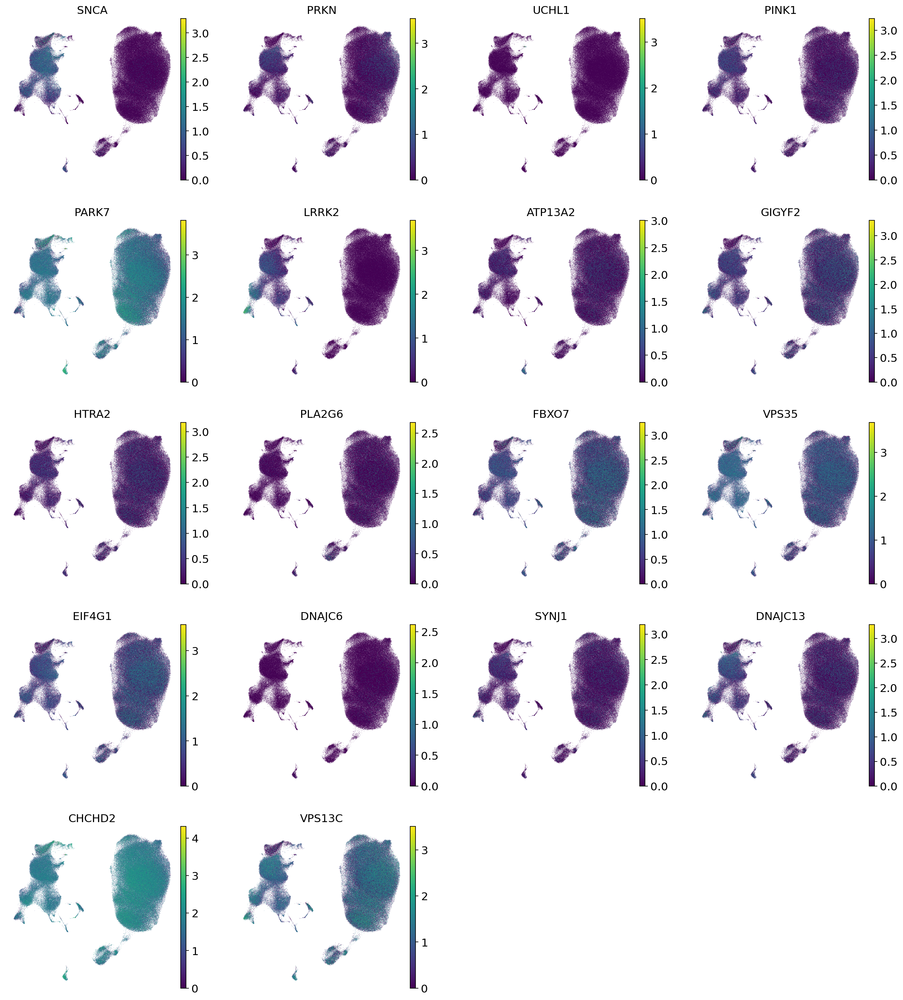

In [7]:
sc.pl.embedding(
        adata,
        basis="umap_filtered",
        color=['SNCA', 'PRKN', 'UCHL1', 'PINK1', 'PARK7', 'LRRK2', 'ATP13A2', 'GIGYF2', 'HTRA2', 'PLA2G6', 'FBXO7', 'VPS35',
 'EIF4G1', 'DNAJC6', 'SYNJ1', 'DNAJC13', 'CHCHD2', 'VPS13C'])

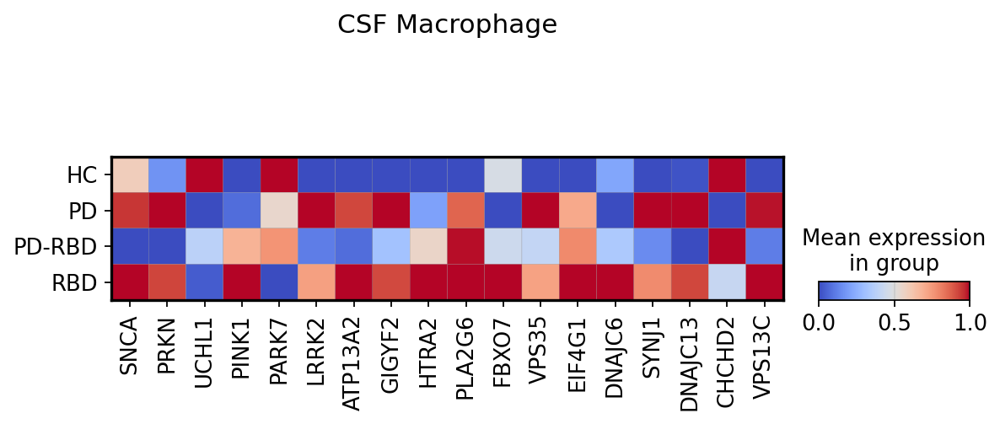

In [13]:
sc.pl.matrixplot(adata[adata.obs['cluster_L2']=='CSF Mac'],
            var_names=['SNCA', 'PRKN', 'UCHL1', 'PINK1', 'PARK7', 'LRRK2', 'ATP13A2', 'GIGYF2', 'HTRA2', 'PLA2G6', 'FBXO7', 'VPS35',
 'EIF4G1', 'DNAJC6', 'SYNJ1', 'DNAJC13', 'CHCHD2', 'VPS13C'],
            groupby='EnrollmentCategory',
            cmap='coolwarm',
            standard_scale='var', 
            title='CSF Macrophage',
            save='CSFMac_PARKgenes')

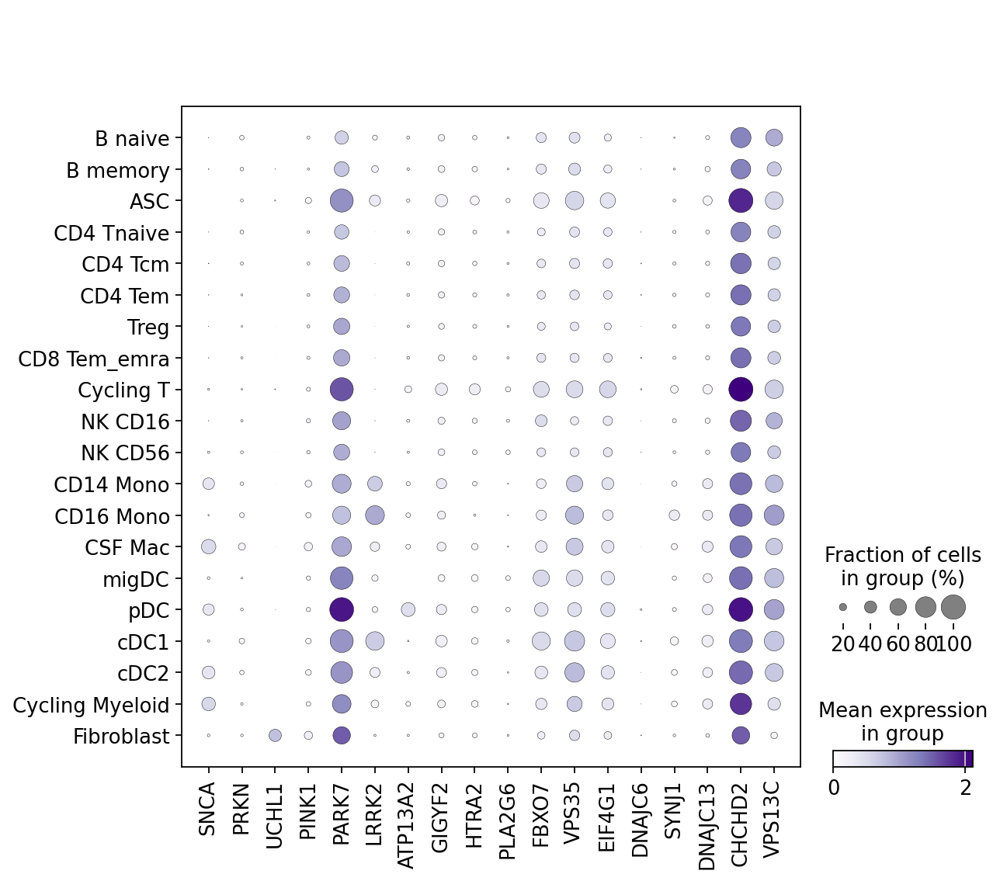

In [13]:
sc.pl.dotplot(adata,
            var_names=['SNCA', 'PRKN', 'UCHL1', 'PINK1', 'PARK7', 'LRRK2', 'ATP13A2', 'GIGYF2', 'HTRA2', 'PLA2G6', 'FBXO7', 'VPS35',
 'EIF4G1', 'DNAJC6', 'SYNJ1', 'DNAJC13', 'CHCHD2', 'VPS13C'],
            groupby='cluster_L2',
            cmap='Purples',
            # standard_scale='var', 
            save='PARKgenes')

In [14]:
# calcurate PAKR gene score
sc.tl.score_genes(adata, gene_list=['SNCA', 'PRKN', 'UCHL1', 'PINK1', 'PARK7', 'LRRK2', 'ATP13A2', 
    'GIGYF2', 'HTRA2', 'PLA2G6', 'FBXO7', 'VPS35',
    'EIF4G1', 'DNAJC6', 'SYNJ1', 'DNAJC13', 'CHCHD2', 'VPS13C'], score_name='PARKgenes')

computing score 'PARKgenes'
    finished: added
    'PARKgenes', score of gene set (adata.obs).
    499 total control genes are used. (0:00:07)


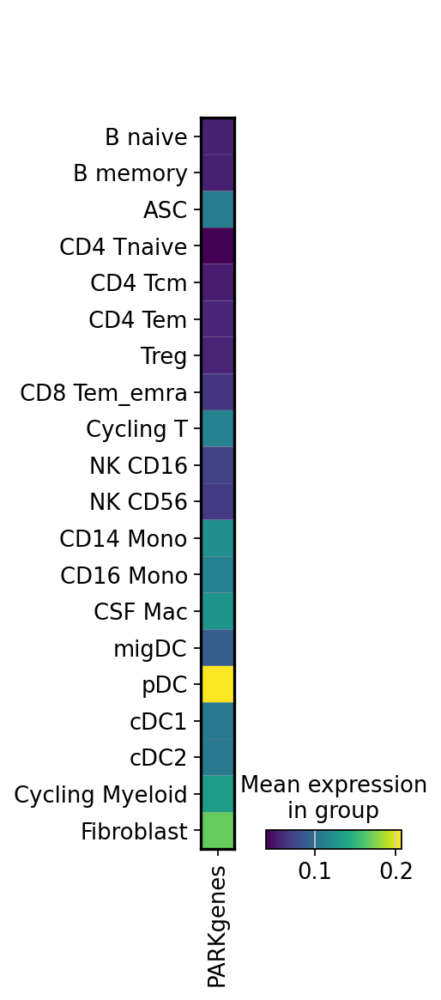

In [16]:
sc.pl.matrixplot(adata, var_names=['PARKgenes'], groupby='cluster_L2', save='parkgene')

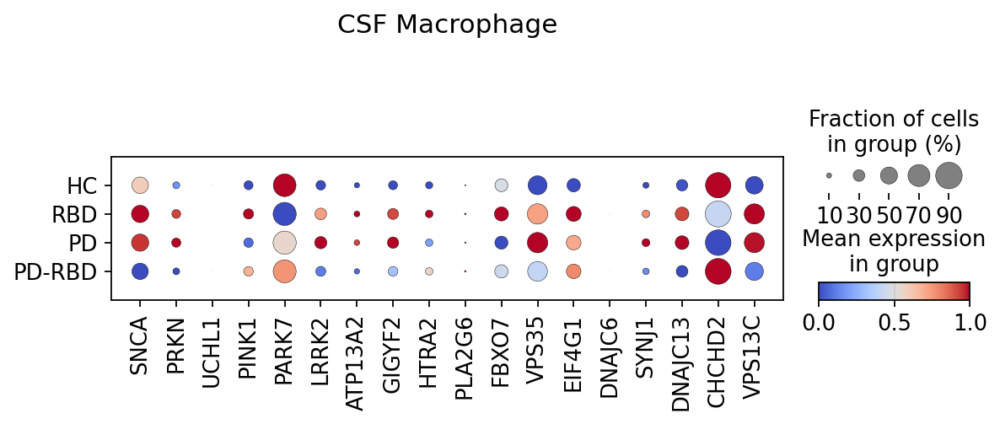

In [10]:
sc.pl.dotplot(adata[adata.obs['cluster_L2']=='CSF Mac'],
            var_names=['SNCA', 'PRKN', 'UCHL1', 'PINK1', 'PARK7', 'LRRK2', 'ATP13A2', 'GIGYF2', 'HTRA2', 'PLA2G6', 'FBXO7', 'VPS35',
 'EIF4G1', 'DNAJC6', 'SYNJ1', 'DNAJC13', 'CHCHD2', 'VPS13C'],
            groupby='EnrollmentCategory',
            cmap='coolwarm',
            standard_scale='var', 
            # order
            categories_order = ['HC', 'RBD', 'PD', 'PD-RBD'],
            title='CSF Macrophage',
            save='CSFMac_PARKgenes')

## QC

In [7]:
adata.obs[['n_genes_by_counts', 'pct_counts_mt']].mean()

n_genes_by_counts    1929.176090
pct_counts_mt           1.825925
dtype: float64

In [6]:
df_qc = adata.obs[['n_genes_by_counts', 'pct_counts_mt', 'SampleID']].groupby(by='SampleID').mean()
df_qc['n_cell'] = adata.obs['SampleID'].value_counts()[df_qc.index]
df_qc = pd.merge(df_qc, adata.obs[['SampleID', 'EnrollmentCategory']].drop_duplicates(), left_index=True, right_on='SampleID').reset_index(drop=True)

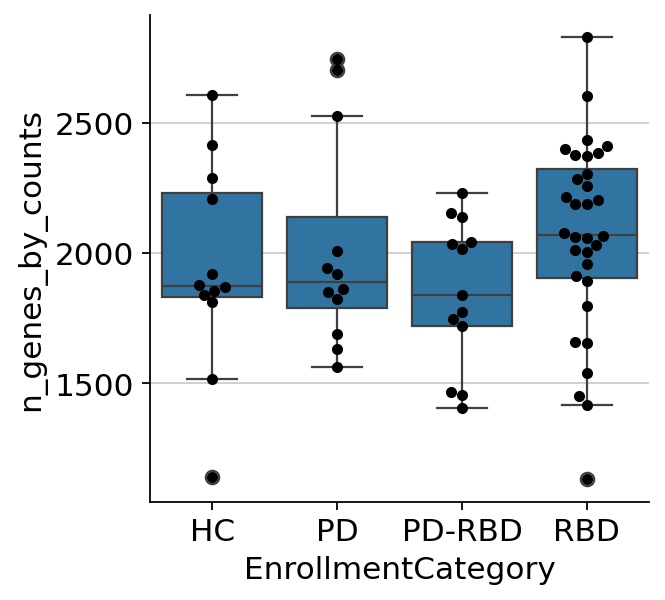

In [7]:
colors = {"HC": "gray", "RBD": "#DEA4CA", "PD": "#A567A1", "PD-RBD": "#595996"}

sns.swarmplot(data=df_qc, x='EnrollmentCategory', y='n_genes_by_counts', color='black')
sns.boxplot(data=df_qc, x='EnrollmentCategory', y='n_genes_by_counts')
sns.despine()
plt.savefig(f'../scanpy/{version}/graph/QC_n_genes_by_counts.pdf')

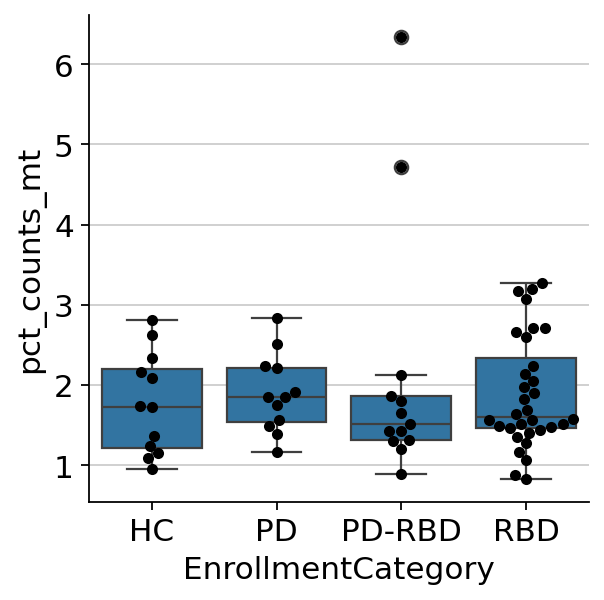

In [8]:
sns.swarmplot(data=df_qc, x='EnrollmentCategory', y='pct_counts_mt', color='black')
sns.boxplot(data=df_qc, x='EnrollmentCategory', y='pct_counts_mt')
sns.despine()
plt.savefig(f'../scanpy/{version}/graph/QC_pct_counts_mt.pdf')

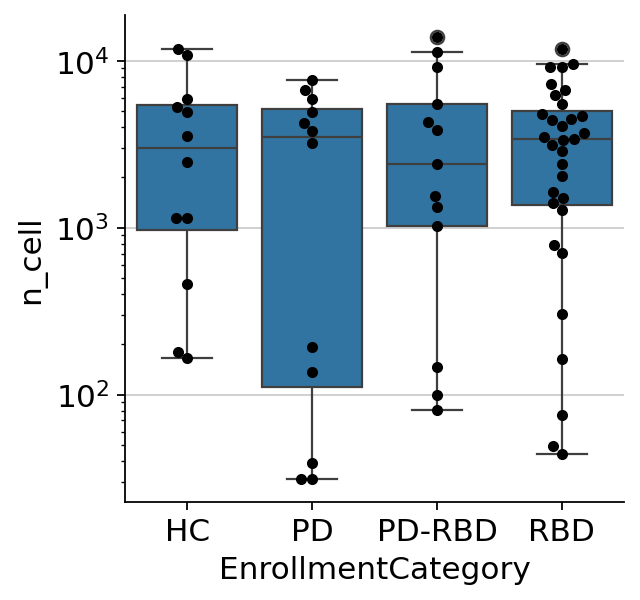

In [9]:
sns.swarmplot(data=df_qc, x='EnrollmentCategory', y='n_cell', color='black')
sns.boxplot(data=df_qc, x='EnrollmentCategory', y='n_cell')
sns.despine()
plt.yscale('log')
plt.savefig(f'../scanpy/{version}/graph/QC_n_cell.pdf')

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/

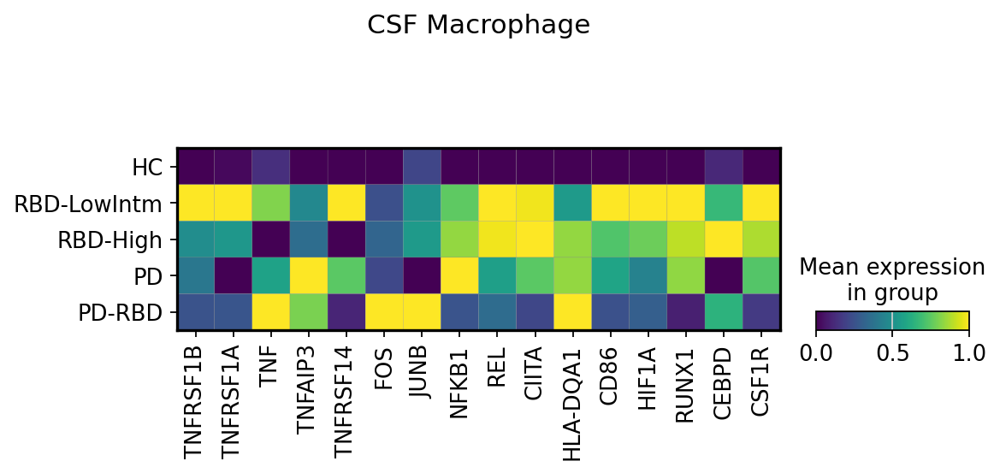

In [29]:
sc.pl.matrixplot(adata[adata.obs['cluster_L2']=='CSF Mac'],
            var_names=['TNFRSF1B', 'TNFRSF1A', 'TNF', 'TNFAIP3', 'TNFRSF14', 'FOS', 'JUNB', 'NFKB1',
            'REL', 'CIITA', 'HLA-DQA1', 'CD86', 'HIF1A', 'RUNX1', 'CEBPD', 'CSF1R'],
            groupby='PD_Probability',
            standard_scale='var', 
            title='CSF Macrophage',
            categories_order=['HC', 'RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD'],
            save='CSFMac_PDprob_TNFgenes')

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


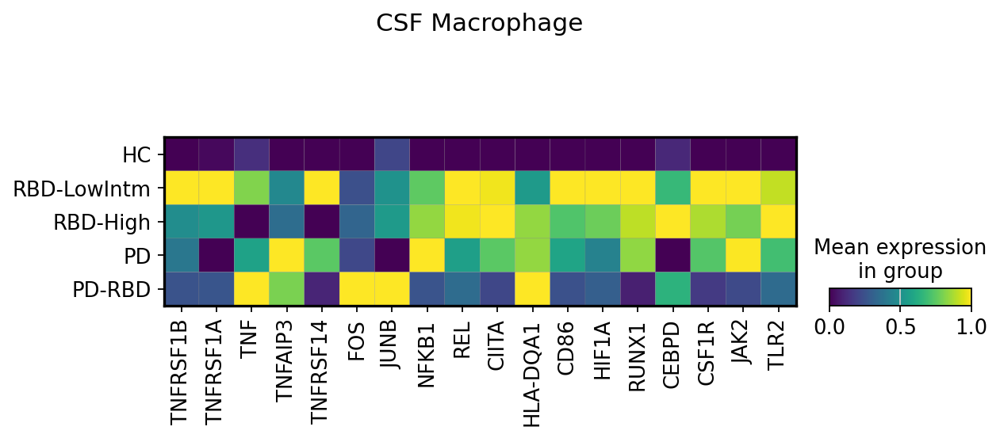

In [7]:
sc.pl.matrixplot(adata[adata.obs['cluster_L2']=='CSF Mac'],
            var_names=['TNFRSF1B', 'TNFRSF1A', 'TNF', 'TNFAIP3', 'TNFRSF14', 'FOS', 'JUNB', 'NFKB1',
            'REL', 'CIITA', 'HLA-DQA1', 'CD86', 'HIF1A', 'RUNX1', 'CEBPD', 'CSF1R', 'JAK2', 'TLR2'],
            groupby='PD_Probability',
            standard_scale='var', 
            title='CSF Macrophage',
            categories_order=['HC', 'RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD'],
            save='CSFMac_PDprob_TNFgenes_v2')

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


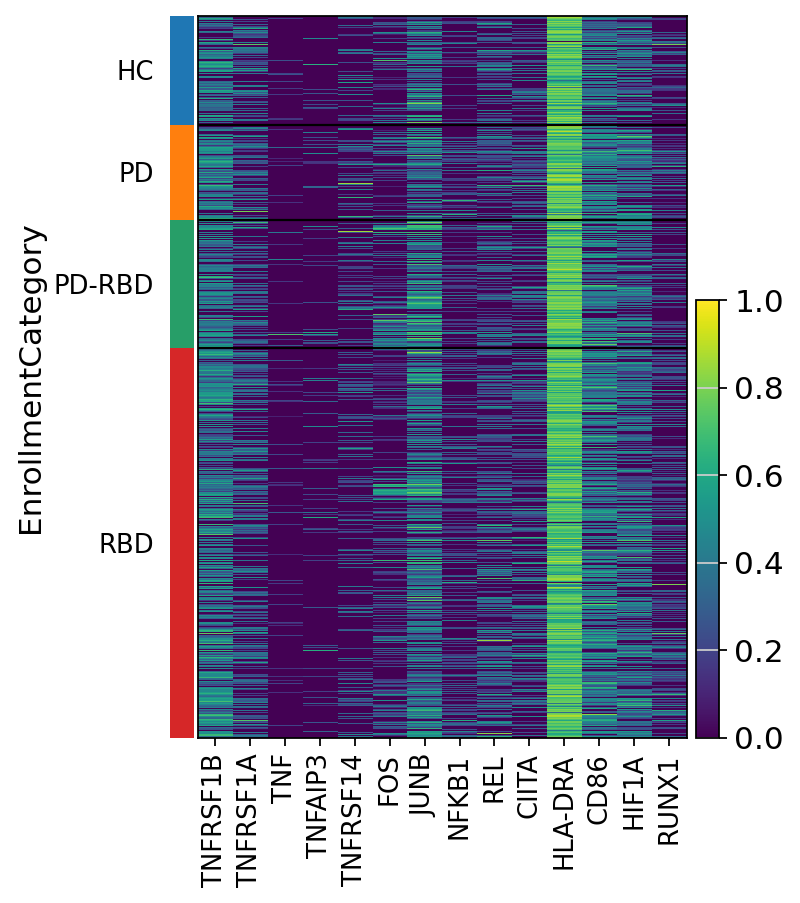

In [10]:
sc.pl.heatmap(adata[adata.obs['cluster_L2']=='CSF Mac'],
            var_names=['TNFRSF1B', 'TNFRSF1A', 'TNF', 'TNFAIP3', 'TNFRSF14', 'FOS', 'JUNB', 'NFKB1',
            'REL', 'CIITA', 'HLA-DRA', 'CD86', 'HIF1A', 'RUNX1'],
            groupby='EnrollmentCategory',
            standard_scale='var', 
            save='CSFMac_TNFgenes')

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c


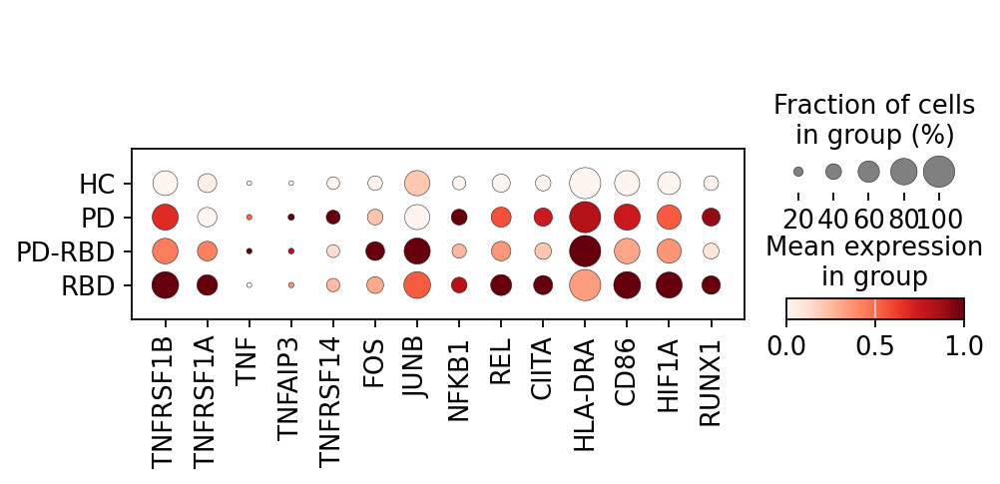

In [8]:
sc.pl.dotplot(adata[adata.obs['cluster_L2']=='CSF Mac'],
            var_names=['TNFRSF1B', 'TNFRSF1A', 'TNF', 'TNFAIP3', 'TNFRSF14', 'FOS', 'JUNB', 'NFKB1',
            'REL', 'CIITA', 'HLA-DRA', 'CD86', 'HIF1A', 'RUNX1'],
            groupby='EnrollmentCategory',
            standard_scale='var', 
            save='CSFMac_TNFgenes')

In [6]:
adata

AnnData object with n_obs × n_vars = 259560 × 24155
    obs: 'cellranger_sample_id', 'SampleID', 'SampleType', 'DonorID', 'Estimated Number of Cells', 'Mean Reads per Cell', 'Median Genes per Cell', 'Number of Reads', 'Valid Barcodes', 'Sequencing Saturation', 'Q30 Bases in Barcode', 'Q30 Bases in RNA Read', 'Q30 Bases in UMI', 'Reads Mapped to Genome', 'Reads Mapped Confidently to Genome', 'Reads Mapped Confidently to Intergenic Regions', 'Reads Mapped Confidently to Intronic Regions', 'Reads Mapped Confidently to Exonic Regions', 'Reads Mapped Confidently to Transcriptome', 'Reads Mapped Antisense to Gene', 'Fraction Reads in Cells', 'Total Genes Detected', 'Median UMI Counts per Cell', 'Q30 Bases in RNA Read 2', 'chemistry', 'Visit', 'SubjectID', 'DateICFSigned', 'YearICFSigned', 'EnrollmentCategory', 'RBDY/N?', 'YearofRBDDx', 'RBDAAO', 'AgeRBDDx', 'RBDDxtoConesnt', 'PDY/N', 'Year1stPDSx', 'YearofPDDx', 'PDAAO', 'AgePDDx', 'PDDxtoConsent', 'DLBY/N', 'Year1stDLBSx', 'YearDLBDX', 'DLB

In [9]:
list(adata.obs['cluster_L2'].unique())

['CD4 Tcm',
 'CSF Mac',
 'cDC2',
 'CD8 Tem_emra',
 'Cycling Myeloid',
 'CD4 Tem',
 'CD14 Mono',
 'CD4 Tnaive',
 'Treg',
 'pDC',
 'B memory',
 'NK CD56',
 'migDC',
 'cDC1',
 'Fibroblast',
 'Cycling T',
 'B naive',
 'ASC',
 'NK CD16',
 'CD16 Mono']

In [12]:
adata[adata.obs['cluster_L2'].isin(['CSF Mac',
 'cDC2',
 'Cycling Myeloid',
 'CD14 Mono',
 'pDC',
 'migDC',
 'cDC1',
 'CD16 Mono'])]

View of AnnData object with n_obs × n_vars = 61822 × 24155
    obs: 'cellranger_sample_id', 'SampleID', 'SampleType', 'DonorID', 'Estimated Number of Cells', 'Mean Reads per Cell', 'Median Genes per Cell', 'Number of Reads', 'Valid Barcodes', 'Sequencing Saturation', 'Q30 Bases in Barcode', 'Q30 Bases in RNA Read', 'Q30 Bases in UMI', 'Reads Mapped to Genome', 'Reads Mapped Confidently to Genome', 'Reads Mapped Confidently to Intergenic Regions', 'Reads Mapped Confidently to Intronic Regions', 'Reads Mapped Confidently to Exonic Regions', 'Reads Mapped Confidently to Transcriptome', 'Reads Mapped Antisense to Gene', 'Fraction Reads in Cells', 'Total Genes Detected', 'Median UMI Counts per Cell', 'Q30 Bases in RNA Read 2', 'chemistry', 'Visit', 'SubjectID', 'DateICFSigned', 'YearICFSigned', 'EnrollmentCategory', 'RBDY/N?', 'YearofRBDDx', 'RBDAAO', 'AgeRBDDx', 'RBDDxtoConesnt', 'PDY/N', 'Year1stPDSx', 'YearofPDDx', 'PDAAO', 'AgePDDx', 'PDDxtoConsent', 'DLBY/N', 'Year1stDLBSx', 'YearDLBDX

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/

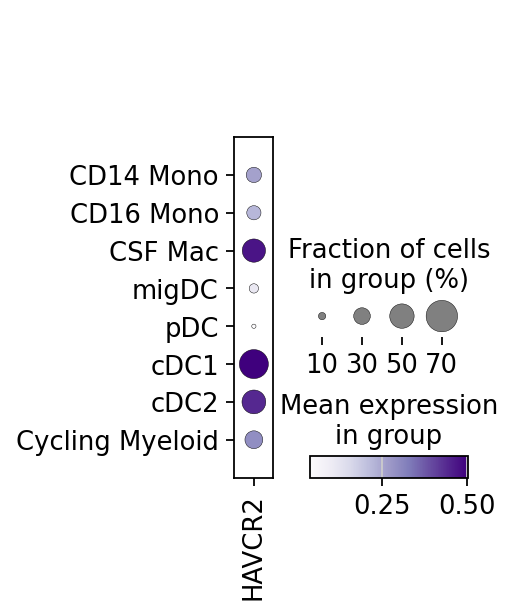

In [18]:
sc.pl.dotplot(adata[adata.obs['cluster_L2'].isin(['CSF Mac',
    'cDC2',
    'Cycling Myeloid',
    'CD14 Mono',
    'pDC',
    'migDC',
    'cDC1',
    'CD16 Mono'])], var_names=['HAVCR2'], 
    groupby='cluster_L2', cmap='Purples', save='Tim3_myelo')

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/

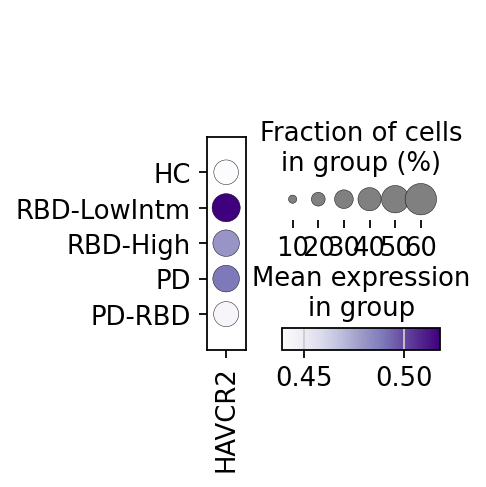

In [17]:
sc.pl.dotplot(adata[adata.obs['cluster_L2'].isin(['CSF Mac'])], var_names=['HAVCR2'], 
    groupby='PD_Probability', cmap='Purples', save='Tim3_CSFMac_PDprob',
    categories_order=['HC', 'RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD'])

In [5]:
adata

AnnData object with n_obs × n_vars = 259560 × 24155
    obs: 'cellranger_sample_id', 'SampleID', 'SampleType', 'DonorID', 'Estimated Number of Cells', 'Mean Reads per Cell', 'Median Genes per Cell', 'Number of Reads', 'Valid Barcodes', 'Sequencing Saturation', 'Q30 Bases in Barcode', 'Q30 Bases in RNA Read', 'Q30 Bases in UMI', 'Reads Mapped to Genome', 'Reads Mapped Confidently to Genome', 'Reads Mapped Confidently to Intergenic Regions', 'Reads Mapped Confidently to Intronic Regions', 'Reads Mapped Confidently to Exonic Regions', 'Reads Mapped Confidently to Transcriptome', 'Reads Mapped Antisense to Gene', 'Fraction Reads in Cells', 'Total Genes Detected', 'Median UMI Counts per Cell', 'Q30 Bases in RNA Read 2', 'chemistry', 'Visit', 'SubjectID', 'DateICFSigned', 'YearICFSigned', 'EnrollmentCategory', 'RBDY/N?', 'YearofRBDDx', 'RBDAAO', 'AgeRBDDx', 'RBDDxtoConesnt', 'PDY/N', 'Year1stPDSx', 'YearofPDDx', 'PDAAO', 'AgePDDx', 'PDDxtoConsent', 'DLBY/N', 'Year1stDLBSx', 'YearDLBDX', 'DLB

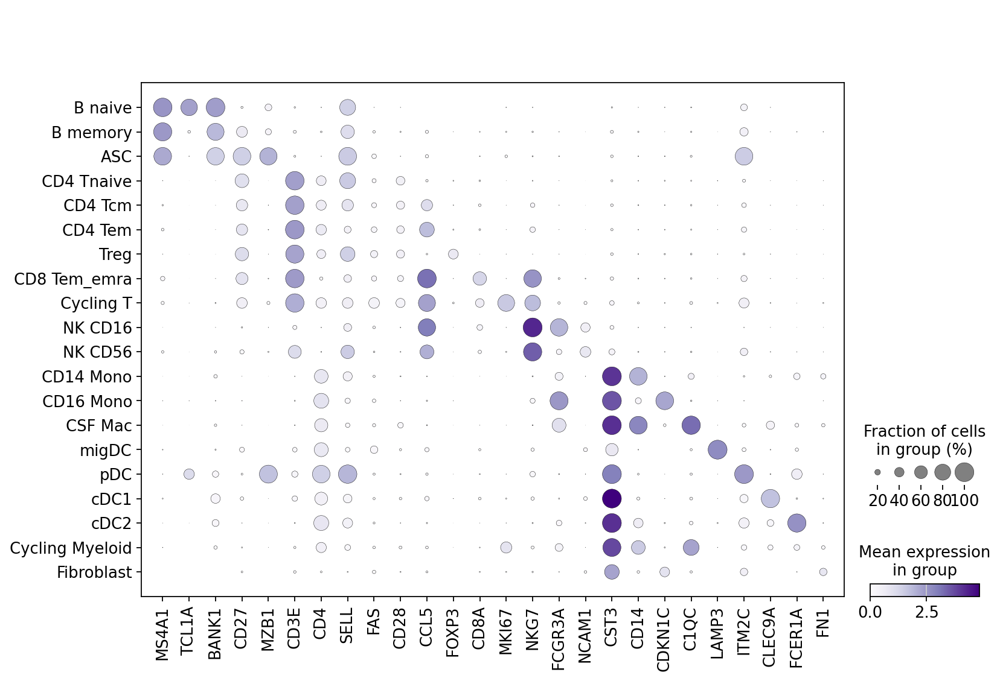

In [23]:
sc.pl.dotplot(adata, var_names=['MS4A1', 'TCL1A', 'BANK1', 'CD27', 'MZB1', 
'CD3E', 'CD4', 'SELL', 'FAS', 'CD28', 'CCL5', 'FOXP3', 'CD8A', 'MKI67',
'NKG7', 'FCGR3A', 'NCAM1', 'CST3', 'CD14', 'CDKN1C',
'C1QC', 'LAMP3', 'ITM2C', 'CLEC9A', 'FCER1A', 'FN1'], 
    groupby='cluster_L2', cmap='Purples', save='l2markers')

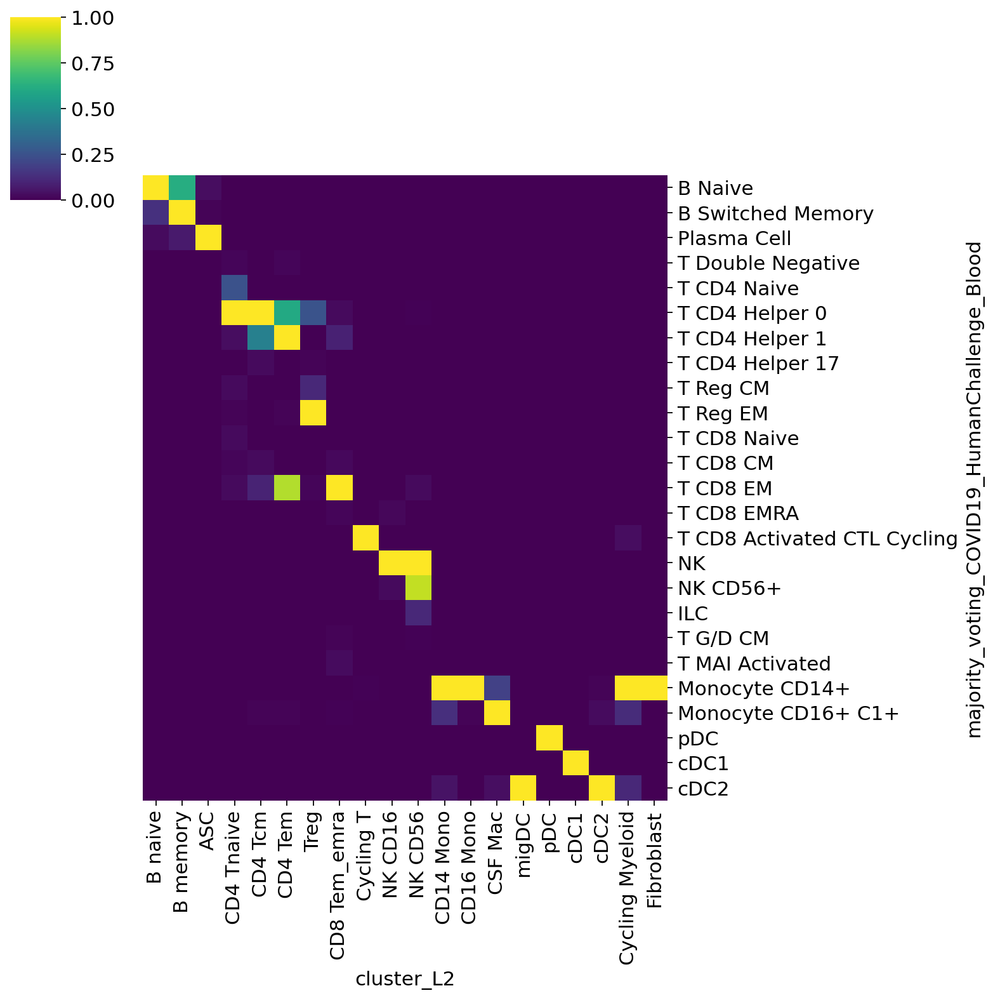

In [42]:
plt.rcParams['axes.grid'] = False

list_order = [
     'B Naive', 
 'B Switched Memory',
 'Plasma Cell',

 'T Double Negative',
  'T CD4 Naive',
    'T CD4 Helper 0',
     'T CD4 Helper 1',
      'T CD4 Helper 17',
       'T Reg CM',
       'T Reg EM',
        'T CD8 Naive',
 'T CD8 CM',
        'T CD8 EM',
         'T CD8 EMRA',
          'T CD8 Activated CTL Cycling',
          'NK',
 'NK CD56+',
 'ILC',
         'T G/D CM',
          'T MAI Activated',
 'Monocyte CD14+',
 'Monocyte CD16+ C1+',
 'pDC',
 'cDC1',
 'cDC2',
]
sns.clustermap(
    pd.crosstab(adata.obs['majority_voting_COVID19_HumanChallenge_Blood'], adata.obs['cluster_L2']).loc[list_order], 
    row_cluster=False,
    col_cluster=False,
    standard_scale=1,
    cmap='viridis'
    )
plt.savefig(f'../scanpy/{version}/graph/clustermap_majority_voting_COVID19_HumanChallenge_Blood.pdf', bbox_inches='tight')

In [35]:
list(adata.obs['majority_voting_COVID19_HumanChallenge_Blood'].unique())

['T CD4 Helper 0',
 'Monocyte CD14+',
 'T CD8 EM',
 'Monocyte CD16+ C1+',
 'T CD4 Helper 1',
 'cDC2',
 'T CD8 EMRA',
 'T Reg EM',
 'T CD8 CM',
 'pDC',
 'Plasma Cell',
 'B Switched Memory',
 'T CD4 Naive',
 'NK',
 'T G/D CM',
 'NK CD56+',
 'ILC',
 'T MAI Activated',
 'T CD8 Naive',
 'B Naive',
 'cDC1',
 'T CD4 Helper 17',
 'T Double Negative',
 'T CD8 Activated CTL Cycling',
 'T Reg CM']

In [7]:
list_park = ['SNCA', 'PRKN', 'UCHL1', 'PINK1', 'PARK7', 'LRRK2',
 'ATP13A2', 'GIGYF2', 'HTRA2', 'PLA2G6', 'FBXO7', 'VPS35',
 'EIF4G1', 'DNAJC6', 'SYNJ1', 'DNAJC13', 'CHCHD2', 'VPS13C']

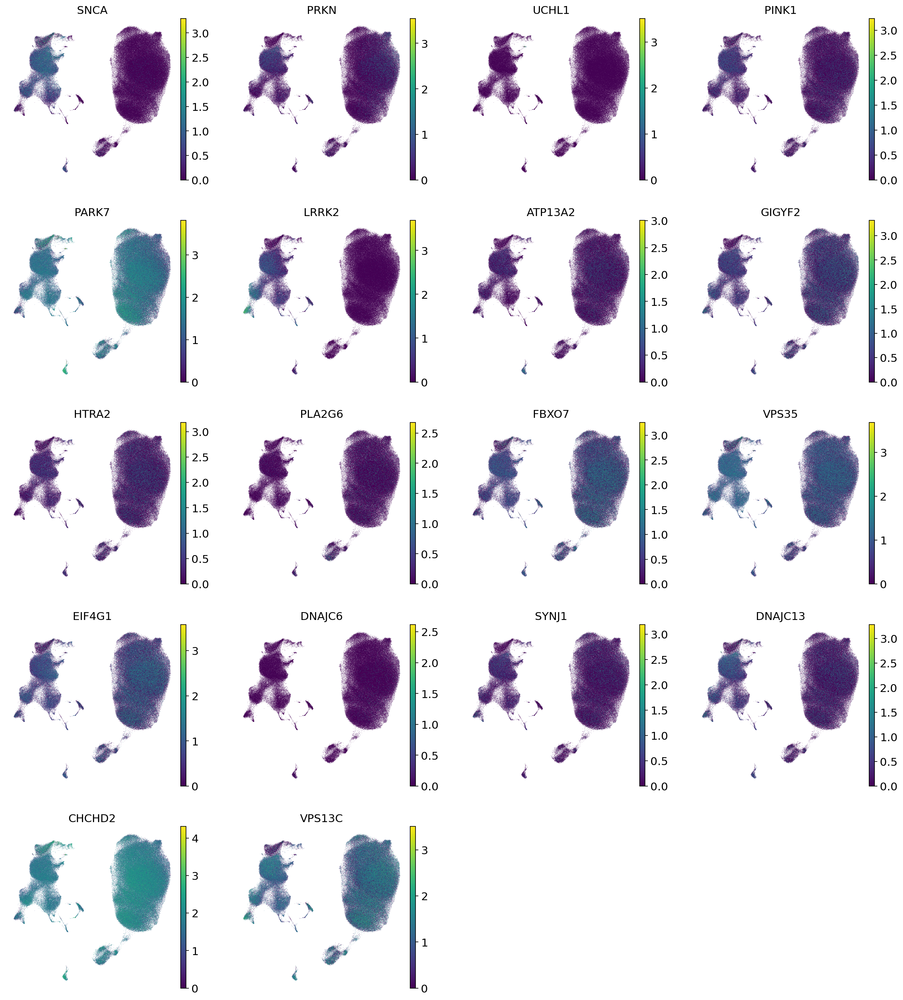

In [8]:
sc.pl.embedding(
        adata,
        basis="umap_filtered", 
        color=list_park, save='park')

/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/site-packages/anndata/_core/anndata.py:1145: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/gpfs/gibbs/project/hafler/yy693/conda_envs/scanpy1.10.2/lib/python3.11/

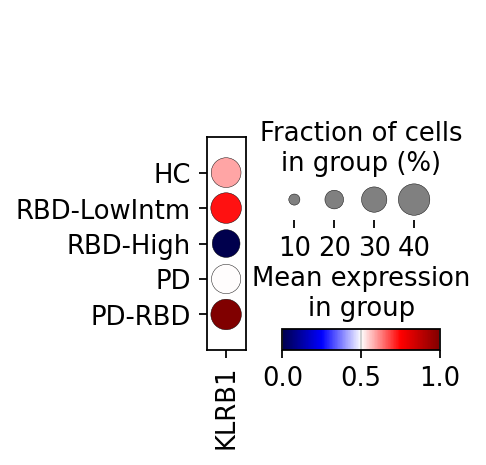

In [10]:
sc.pl.dotplot(adata[adata.obs['cluster_L2']=='CD4 Tcm'],
 var_names = ['KLRB1'],
 groupby='PD_Probability', cmap='seismic', standard_scale='var',
 categories_order=['HC', 'RBD-LowIntm', 'RBD-High', 'PD', 'PD-RBD'],
  save='KLRB1_CD4Tcm_PDprob',)